# Молочное хозяйство «Вольный луг»

***Цели исследования:***

1. Изучить данные о характеристиках коров "Вольного луга" и "ЭкоФермы".
2. Выявить закономерности и факторы, определяющие показатель годового удоя молока и его вкус.
3. Определить список коров, которые стоит приобрести владельцу молочного хозяйства "Вольный луг"

***Задачи и ход исследования:***

1. Предобработка данных.
2. Исследовательский анализ данных.

   - Построить распределение коров обоих хозяйств по количественным и качественным показателям.
   - Избавиться от возможных ошибок и выбросов в данных, которые не были устранены на стадии предобработки данных.  

3. Корреляционный анализ.

   - Выявить количественные показатели, которые больше всего влияют показатель удоя.
   - Выявить качественные показатели, которые больше всего влияют показатель удоя.
4. Обучить модель линейной регрессии на данных м/х Вольный луг и спрогнозировать удой коров ЭкоФермы.
5. Обучить модель логистической регрессии на данных м/х Вольный луг и спрогнозировать вкус молока коров ЭкоФермы.

***Описание данных***

Для работы с проектом предоставлены 3 датасета:
1. `ferma_main` - данные о стаде фермера на текущий момент.
2. `ferma_dad` - имя папы каждой коровы в стаде фермера.
3. `cow_buy` - данные о коровах «ЭкоФермы», которых фермер хочет изучить перед покупкой.

## Загрузка данных

In [1]:
# Все импорты тут:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Разделение данных на выборки
from sklearn.model_selection import train_test_split

# Прямое кодирование категориальных признаков
from sklearn.preprocessing import OneHotEncoder 

# Масштабирование количественных признаков стандартизацией
from sklearn.preprocessing import StandardScaler

# Модель линейной регрессии, Модель логистической регрессии
from sklearn.linear_model import LinearRegression, LogisticRegression

# Коэффициент детерминации R2, MAE, MSE, RMSE, матрица ошибок
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, accuracy_score, precision_score, recall_score, confusion_matrix

# создание константы RANDOM_STATE
RANDOM_STATE = 42

In [2]:
# Открытие данных через конструкцию try-except

try:
    ferma_main = pd.read_csv('datasets/ferma_main.csv', sep=';')
    ferma_dad = pd.read_csv('datasets/ferma_dad.csv', sep=';')
    cow_buy = pd.read_csv('datasets/cow_buy.csv', sep=';')

except:
    ferma_main = pd.read_csv('/datasets/ferma_main.csv', sep=';')
    ferma_dad = pd.read_csv('/datasets/ferma_dad.csv', sep=';')
    cow_buy = pd.read_csv('/datasets/cow_buy.csv', sep=';')

In [3]:
# Список датафреймов
df_list = [ferma_main, ferma_dad, cow_buy]

In [4]:
# Выведем первые строки и общую информацию о каждом датасете
for df in df_list:
    print('_' * 60)
    print('_' * 60)
    display(df.head())
    display(df.info())
    display(df.describe())

____________________________________________________________
____________________________________________________________


,id,"Удой, кг",ЭКЕ (Энергетическая кормовая единица),"Сырой протеин, г",СПО (Сахаро-протеиновое соотношение),Порода,Тип пастбища,порода папы_быка,"Жирность,%","Белок,%",Вкус молока,Возраст
0,1,5863,"14,2",1743,"0,89",Вис Бик Айдиал,Равнинное,Айдиал,"3,58","3,076",вкусно,более_2_лет
1,2,5529,"12,8",2138,"0,89",Вис Бик Айдиал,Равнинные,Соверин,"3,54","3,079",вкусно,менее_2_лет
2,3,5810,14,1854,"0,885",РефлешнСоверинг,Холмистое,Соверин,"3,59","3,074",не вкусно,более_2_лет
3,4,5895,"12,4",2012,"0,885",РефлешнСоверинг,Холмистое,Айдиал,"3,4","3,075",не вкусно,более_2_лет
4,5,5302,"12,8",1675,"0,885",Вис Бик Айдиал,Равнинные,Соверин,"3,73","3,073",вкусно,менее_2_лет


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 634 entries, 0 to 633
Data columns (total 12 columns):
 #   Column                                 Non-Null Count  Dtype 
---  ------                                 --------------  ----- 
 0   id                                     634 non-null    int64 
 1   Удой, кг                               634 non-null    int64 
 2   ЭКЕ (Энергетическая кормовая единица)  634 non-null    object
 3   Сырой протеин, г                       634 non-null    int64 
 4   СПО (Сахаро-протеиновое соотношение)   634 non-null    object
 5   Порода                                 634 non-null    object
 6   Тип пастбища                           634 non-null    object
 7   порода папы_быка                       634 non-null    object
 8   Жирность,%                             634 non-null    object
 9   Белок,%                                634 non-null    object
 10  Вкус молока                            634 non-null    object
 11  Возраст            

None

,id,"Удой, кг","Сырой протеин, г"
count,634.000000,634.000000,634.000000
mean,317.460568,6187.025237,1922.682965
std,183.096982,1638.401021,182.392548
min,1.000000,5204.000000,1660.000000
25%,159.250000,5751.750000,1772.250000
50%,317.500000,6130.500000,1880.500000
75%,475.750000,6501.000000,2058.750000
max,629.000000,45616.000000,2349.000000


____________________________________________________________
____________________________________________________________


,id,Имя Папы
0,1,Буйный
1,2,Соловчик
2,3,Барин
3,4,Буйный
4,5,Барин


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 629 entries, 0 to 628
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   id        629 non-null    int64 
 1   Имя Папы  629 non-null    object
dtypes: int64(1), object(1)
memory usage: 10.0+ KB


None

,id
count,629.00000
mean,315.00000
std,181.72094
min,1.00000
25%,158.00000
50%,315.00000
75%,472.00000
max,629.00000


____________________________________________________________
____________________________________________________________


,Порода,Тип пастбища,порода папы_быка,Имя_папы,"Текущая_жирность,%","Текущий_уровень_белок,%",Возраст
0,Вис Бик Айдиал,холмистое,Айдиал,Геркулес,"3,58","3,076",более_2_лет
1,Вис Бик Айдиал,равнинное,Соверин,Буйный,"3,54","3,081",менее_2_лет
2,РефлешнСоверинг,равнинное,Соверин,Барин,"3,59","3,074",более_2_лет
3,РефлешнСоверинг,холмистое,Айдиал,Буйный,"3,4","3,061",более_2_лет
4,РефлешнСоверинг,равнинное,Айдиал,Буйный,"3,64","3,074",более_2_лет


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   Порода                   20 non-null     object
 1   Тип пастбища             20 non-null     object
 2   порода папы_быка         20 non-null     object
 3   Имя_папы                 20 non-null     object
 4   Текущая_жирность,%       20 non-null     object
 5   Текущий_уровень_белок,%  20 non-null     object
 6   Возраст                  20 non-null     object
dtypes: object(7)
memory usage: 1.2+ KB


None

,Порода,Тип пастбища,порода папы_быка,Имя_папы,"Текущая_жирность,%","Текущий_уровень_белок,%",Возраст
count,20,20,20,20,20,20,20
unique,2,2,2,4,12,12,2
top,РефлешнСоверинг,равнинное,Соверин,Буйный,"3,4","3,074",более_2_лет
freq,11,11,12,8,3,5,15


__Таким образом, в нашем распоряжении 3 датафрейма:__

1. `ferma_main` - данные о стаде фермера на текущий момент.
2. `ferma_dad` - имя папы каждой коровы в стаде фермера.
3. `cow_buy` - данные о коровах «ЭкоФермы», которых фермер хочет изучить перед покупкой.

##  Предобработка данных

### Перевод столбцов к языку Python

In [5]:
ferma_main = ferma_main.rename(columns={'Удой, кг': 'yield_kg', 
                                        'ЭКЕ (Энергетическая кормовая единица)': 'feed_energy_unit', 
                                        'Сырой протеин, г': 'protein_g', 
                                        'СПО (Сахаро-протеиновое соотношение)': 'sugar_protein_ratio', 
                                        'Порода': 'breed', 
                                        'Тип пастбища': 'pasture', 
                                        'порода папы_быка': 'breed_dad', 
                                        'Жирность,%': 'fat_content_per', 
                                        'Белок,%': 'protein_per', 
                                        'Вкус молока': 'taste', 
                                        'Возраст': 'age'})
ferma_dad = ferma_dad.rename(columns={'Имя Папы': 'name_dad'})
cow_buy = cow_buy.rename(columns={'Порода': 'breed',
                                  'Тип пастбища': 'pasture',
                                  'порода папы_быка': 'breed_dad',
                                  'Имя_папы': 'name_dad',
                                  'Текущая_жирность,%': 'fat_content_per',
                                  'Текущий_уровень_белок,%': 'protein_per',
                                  'Возраст': 'age'})

In [6]:
df_list = [ferma_main, ferma_dad, cow_buy]
for df in df_list:
    print('_' * 60)
    print('_' * 60)
    display(df.head())
    display(df.info())
    display(df.describe())

____________________________________________________________
____________________________________________________________


,id,yield_kg,feed_energy_unit,protein_g,sugar_protein_ratio,breed,pasture,breed_dad,fat_content_per,protein_per,taste,age
0,1,5863,"14,2",1743,"0,89",Вис Бик Айдиал,Равнинное,Айдиал,"3,58","3,076",вкусно,более_2_лет
1,2,5529,"12,8",2138,"0,89",Вис Бик Айдиал,Равнинные,Соверин,"3,54","3,079",вкусно,менее_2_лет
2,3,5810,14,1854,"0,885",РефлешнСоверинг,Холмистое,Соверин,"3,59","3,074",не вкусно,более_2_лет
3,4,5895,"12,4",2012,"0,885",РефлешнСоверинг,Холмистое,Айдиал,"3,4","3,075",не вкусно,более_2_лет
4,5,5302,"12,8",1675,"0,885",Вис Бик Айдиал,Равнинные,Соверин,"3,73","3,073",вкусно,менее_2_лет


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 634 entries, 0 to 633
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   id                   634 non-null    int64 
 1   yield_kg             634 non-null    int64 
 2   feed_energy_unit     634 non-null    object
 3   protein_g            634 non-null    int64 
 4   sugar_protein_ratio  634 non-null    object
 5   breed                634 non-null    object
 6   pasture              634 non-null    object
 7   breed_dad            634 non-null    object
 8   fat_content_per      634 non-null    object
 9   protein_per          634 non-null    object
 10  taste                634 non-null    object
 11  age                  634 non-null    object
dtypes: int64(3), object(9)
memory usage: 59.6+ KB


None

,id,yield_kg,protein_g
count,634.000000,634.000000,634.000000
mean,317.460568,6187.025237,1922.682965
std,183.096982,1638.401021,182.392548
min,1.000000,5204.000000,1660.000000
25%,159.250000,5751.750000,1772.250000
50%,317.500000,6130.500000,1880.500000
75%,475.750000,6501.000000,2058.750000
max,629.000000,45616.000000,2349.000000


____________________________________________________________
____________________________________________________________


,id,name_dad
0,1,Буйный
1,2,Соловчик
2,3,Барин
3,4,Буйный
4,5,Барин


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 629 entries, 0 to 628
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   id        629 non-null    int64 
 1   name_dad  629 non-null    object
dtypes: int64(1), object(1)
memory usage: 10.0+ KB


None

,id
count,629.00000
mean,315.00000
std,181.72094
min,1.00000
25%,158.00000
50%,315.00000
75%,472.00000
max,629.00000


____________________________________________________________
____________________________________________________________


,breed,pasture,breed_dad,name_dad,fat_content_per,protein_per,age
0,Вис Бик Айдиал,холмистое,Айдиал,Геркулес,"3,58","3,076",более_2_лет
1,Вис Бик Айдиал,равнинное,Соверин,Буйный,"3,54","3,081",менее_2_лет
2,РефлешнСоверинг,равнинное,Соверин,Барин,"3,59","3,074",более_2_лет
3,РефлешнСоверинг,холмистое,Айдиал,Буйный,"3,4","3,061",более_2_лет
4,РефлешнСоверинг,равнинное,Айдиал,Буйный,"3,64","3,074",более_2_лет


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   breed            20 non-null     object
 1   pasture          20 non-null     object
 2   breed_dad        20 non-null     object
 3   name_dad         20 non-null     object
 4   fat_content_per  20 non-null     object
 5   protein_per      20 non-null     object
 6   age              20 non-null     object
dtypes: object(7)
memory usage: 1.2+ KB


None

,breed,pasture,breed_dad,name_dad,fat_content_per,protein_per,age
count,20,20,20,20,20,20,20
unique,2,2,2,4,12,12,2
top,РефлешнСоверинг,равнинное,Соверин,Буйный,"3,4","3,074",более_2_лет
freq,11,11,12,8,3,5,15


### Изменение типов данных

В датафрейме ferma_main необходимо изменить тип данных в следующих столбцах:
- feed_energy_unit: object -> float64
- sugar_protein_ratio: object -> float64
- fat_content_per: object -> float64
- protein_per: object -> float64
- taste: object -> bool

In [7]:
ferma_main['feed_energy_unit'] = ferma_main['feed_energy_unit'].str.replace(',','.')
ferma_main['feed_energy_unit'] = ferma_main['feed_energy_unit'].astype('float', errors='raise')

ferma_main['sugar_protein_ratio'] = ferma_main['sugar_protein_ratio'].str.replace(',','.')
ferma_main['sugar_protein_ratio'] = ferma_main['sugar_protein_ratio'].astype('float', errors='raise')


ferma_main['fat_content_per'] = ferma_main['fat_content_per'].str.replace(',','.')
ferma_main['fat_content_per'] = ferma_main['fat_content_per'].astype('float', errors='raise')

ferma_main['protein_per'] = ferma_main['protein_per'].str.replace(',','.')
ferma_main['protein_per'] = ferma_main['protein_per'].astype('float', errors='raise')

In [8]:
ferma_main['taste'].unique()

array(['вкусно', 'не вкусно'], dtype=object)

In [9]:
map_dict={'вкусно': True, 'не вкусно': False}
ferma_main['taste'] = ferma_main['taste'].map(map_dict)

In [10]:
ferma_main['taste'].value_counts()

True     371
False    263
Name: taste, dtype: int64

In [11]:
ferma_main.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 634 entries, 0 to 633
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   id                   634 non-null    int64  
 1   yield_kg             634 non-null    int64  
 2   feed_energy_unit     634 non-null    float64
 3   protein_g            634 non-null    int64  
 4   sugar_protein_ratio  634 non-null    float64
 5   breed                634 non-null    object 
 6   pasture              634 non-null    object 
 7   breed_dad            634 non-null    object 
 8   fat_content_per      634 non-null    float64
 9   protein_per          634 non-null    float64
 10  taste                634 non-null    bool   
 11  age                  634 non-null    object 
dtypes: bool(1), float64(4), int64(3), object(4)
memory usage: 55.2+ KB


В датафрейме cow_buy необходимо изменить тип данных в следующих столбцах:
- fat_content_per: object -> float64
- protein_per: object -> float64

In [12]:
cow_buy['fat_content_per'] = cow_buy['fat_content_per'].str.replace(',','.')
cow_buy['fat_content_per'] = cow_buy['fat_content_per'].astype('float', errors='raise')

cow_buy['protein_per'] = cow_buy['protein_per'].str.replace(',','.')
cow_buy['protein_per'] = cow_buy['protein_per'].astype('float', errors='raise')

### Проверка на наличие явных дубликатов

In [13]:
for df in df_list:
    display(df.duplicated().sum())

5

0

4

In [14]:
ferma_main = ferma_main.drop_duplicates()
cow_buy = cow_buy.drop_duplicates()

df_list[0] = ferma_main
df_list[2] = cow_buy

In [15]:
for df in df_list:
    display(df.duplicated().sum())

0

0

0

Удалось убрать 9 явных дубликатов.

### Проверка на наличие неявных дубликатов в категориальных признаках

#### ferma_main

In [16]:
print(ferma_main['breed'].sort_values().unique())
len(ferma_main.breed.unique())

['Вис Бик Айдиал' 'РефлешнСоверинг']


2

Неявные дубликаты не обнаружены

In [17]:
print(ferma_main['breed_dad'].sort_values().unique())
len(ferma_main.breed_dad.unique())

['Айдиал' 'Айдиалл' 'Соверин']


3

In [18]:
# Необходимо переименовать "Айдиалл" на "Айдиал"
ferma_main['breed_dad'] = ferma_main['breed_dad'].str.replace('Айдиалл', 'Айдиал')

In [19]:
print(ferma_main['pasture'].sort_values().unique())
len(ferma_main.pasture.unique())

['Равнинное' 'Равнинные' 'Холмистое']


3

In [20]:
# Необходимо переименовать "Равнинные" на "Равнинное"
ferma_main['pasture'] = ferma_main['pasture'].str.replace('Равнинные', 'Равнинное')

#### cow_buy

In [21]:
print(cow_buy['breed'].sort_values().unique())
len(cow_buy.breed.unique())

['Вис Бик Айдиал' 'РефлешнСоверинг']


2

Неявные дубликаты не обнаружены

In [22]:
print(cow_buy['breed_dad'].sort_values().unique())
len(cow_buy.breed_dad.unique())

['Айдиал' 'Соверин']


2

Неявные дубликаты не обнаружены

In [23]:
print(cow_buy['pasture'].sort_values().unique())
len(cow_buy.pasture.unique())

['равнинное' 'холмистое']


2

Неявные дубликаты не обнаружены

### Проверка на наличие пропущенных значений

In [24]:
for df in df_list:
    display(df.isna().sum())
    print('_' * 30)

id                     0
yield_kg               0
feed_energy_unit       0
protein_g              0
sugar_protein_ratio    0
breed                  0
pasture                0
breed_dad              0
fat_content_per        0
protein_per            0
taste                  0
age                    0
dtype: int64

______________________________


id          0
name_dad    0
dtype: int64

______________________________


breed              0
pasture            0
breed_dad          0
name_dad           0
fat_content_per    0
protein_per        0
age                0
dtype: int64

______________________________


### Разделение признаков в датасете ferma_main

**Характеристики коровы (cow_main):**
 - id, Порода, порода папы_быка, Возраст.

**Характеристики корма (feed_main):**
 - ЭКЕ (Энергетическая кормовая единица), Сырой протеин, г, СПО (Сахаро-протеиновое соотношение).

**Характеристика пастбища (pasture_main):**
 - Тип пастбища.

**Характеристики молока (milk_main):**
 - Удой, кг, Жирность,%, Белок,%, Вкус молока.

In [25]:
cow_main = ferma_main[['id', 'breed', 'breed_dad', 'age']]
feed_main = ferma_main[['id', 'feed_energy_unit', 'protein_g', 'sugar_protein_ratio']]
pasture_main = ferma_main[['id', 'pasture']]
milk_main = ferma_main[['id', 'yield_kg', 'fat_content_per', 'protein_per', 'taste']]

In [26]:
pasture_main.head()

,id,pasture
0,1,Равнинное
1,2,Равнинное
2,3,Холмистое
3,4,Холмистое
4,5,Равнинное


## Исследовательский анализ данных

### Функции для построения диаграмм

In [27]:
# Функция для построения диаграммы размаха и гистограммы для количественных признаков
def box_hist_plot(data, column, title, xlabel, bins):
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(14, 7))
    fig.suptitle(title, fontsize=20)
    
    ax1.boxplot(data[column])
    ax1.set_title('Диаграмма размаха')
    ax1.set_xticks([])
    ax1.set_xlabel(xlabel)
    
    ax2.hist(data[column], bins=bins)
    ax2.set_title('Гистограмма')
    ax2.set_xlabel(xlabel)

    plt.show()

In [28]:
# Функция для построения столбчатой и круговой диаграмм для категориальных признаков
def bar_round_plot(data, column, title):
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(14, 7))
    fig.suptitle(title, fontsize=20)
    
    ax1.bar(height=data[column].value_counts(), x=data[column].value_counts().index)
    ax1.set_title('Столбчатая диаграмма')
    # Добавление подписей через plt.annotate
    for p in ax1.patches:
        height = p.get_height()
        ax1.annotate(f'{height.round(2)}',
                     (p.get_x() + p.get_width() / 2, height),
                     ha='center',
                     va='bottom')

    ax2.pie(x=data[column].value_counts(),
                  autopct='%1.1f%%',
                  wedgeprops={'lw':2, 'ls':'-','edgecolor':"k"}) 
    ax2.set_title('Круговая диаграмма')
    ax2.legend(data[column].value_counts().index, loc="upper right")

    plt.show()

### Количественные признаки

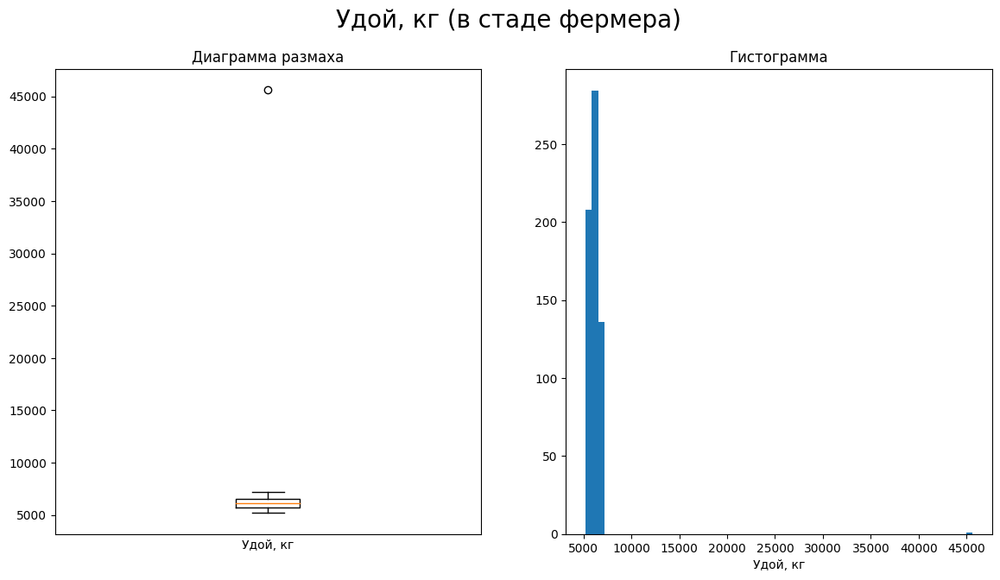

In [29]:
box_hist_plot(ferma_main, 'yield_kg', 'Удой, кг (в стаде фермера)', 'Удой, кг', 60)

Обнаружены выбросы, которые сильно выбиваются от основной массы данных. От них необходимо избавиться.

In [30]:
ferma_main = ferma_main.query('yield_kg <= 15000')

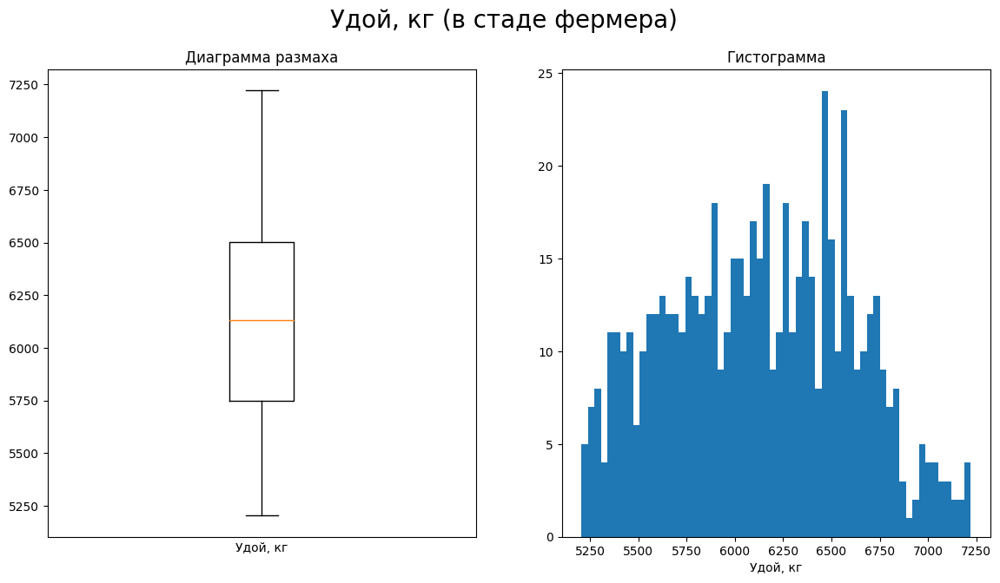

In [31]:
box_hist_plot(ferma_main, 'yield_kg', 'Удой, кг (в стаде фермера)', 'Удой, кг', 60)

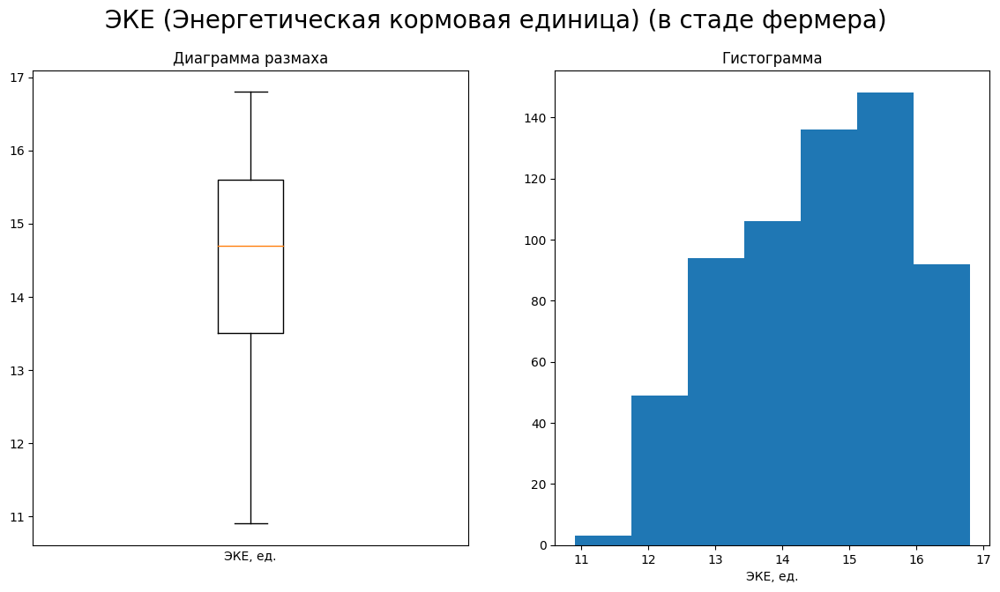

In [32]:
box_hist_plot(ferma_main, 'feed_energy_unit', 'ЭКЕ (Энергетическая кормовая единица) (в стаде фермера)', 'ЭКЕ, ед.', 7)

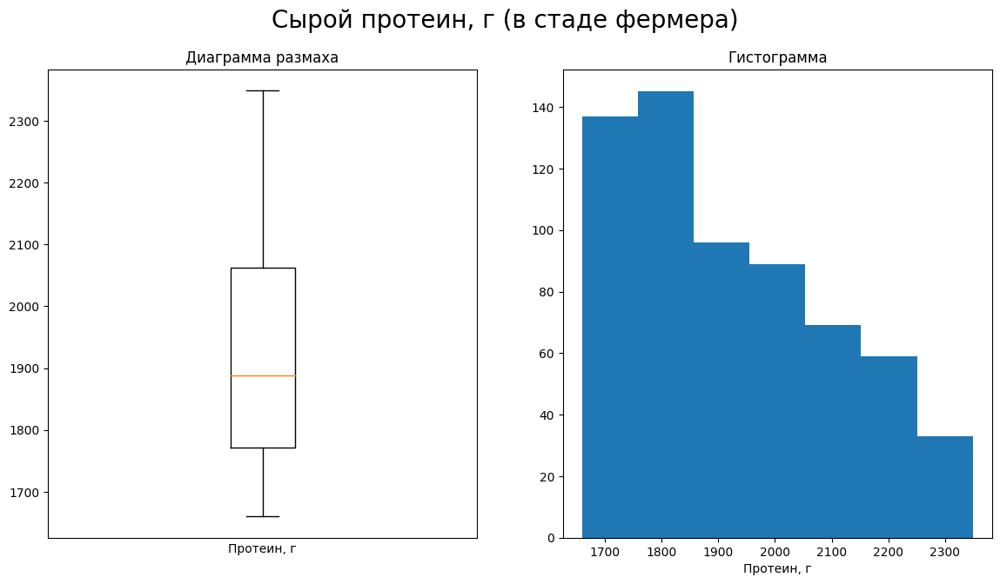

In [33]:
box_hist_plot(ferma_main, 'protein_g', 'Сырой протеин, г (в стаде фермера)', 'Протеин, г', 7)

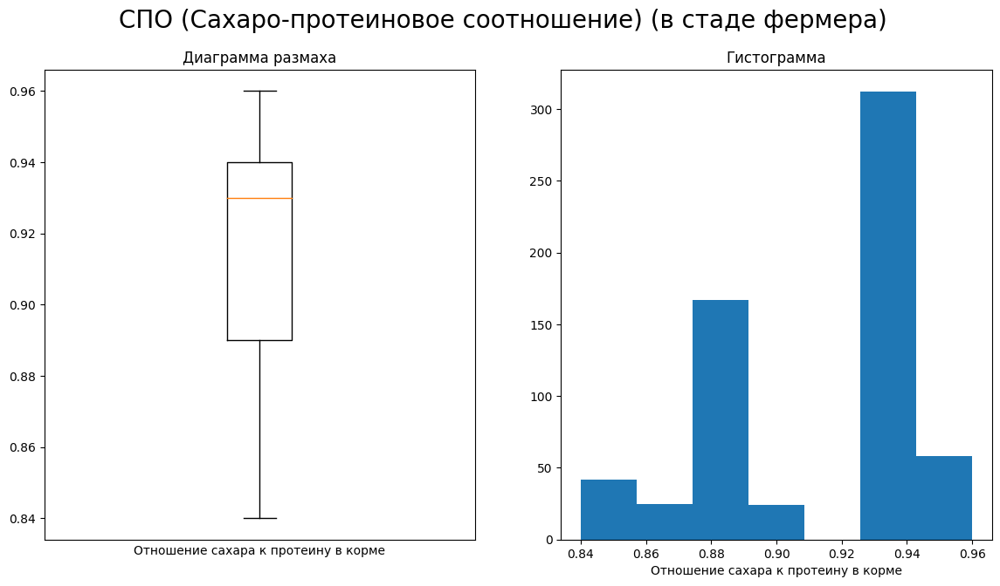

In [34]:
box_hist_plot(ferma_main, 'sugar_protein_ratio', 'СПО (Сахаро-протеиновое соотношение) (в стаде фермера)', 'Отношение сахара к протеину в корме', 7)

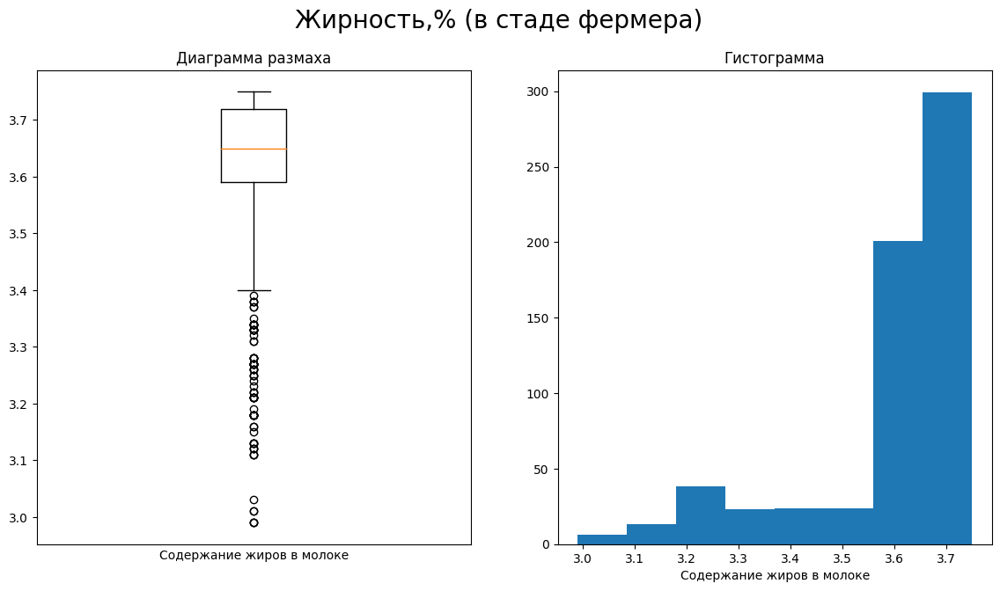

In [35]:
box_hist_plot(ferma_main, 'fat_content_per', 'Жирность,% (в стаде фермера)', 'Содержание жиров в молоке', 8)

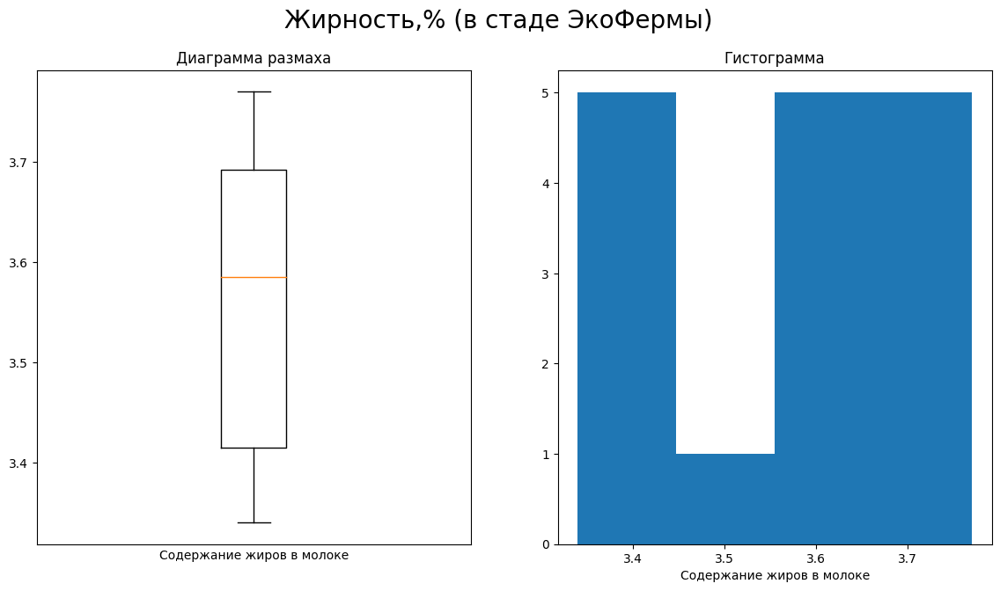

In [36]:
box_hist_plot(cow_buy, 'fat_content_per', 'Жирность,% (в стаде ЭкоФермы)', 'Содержание жиров в молоке', 4)

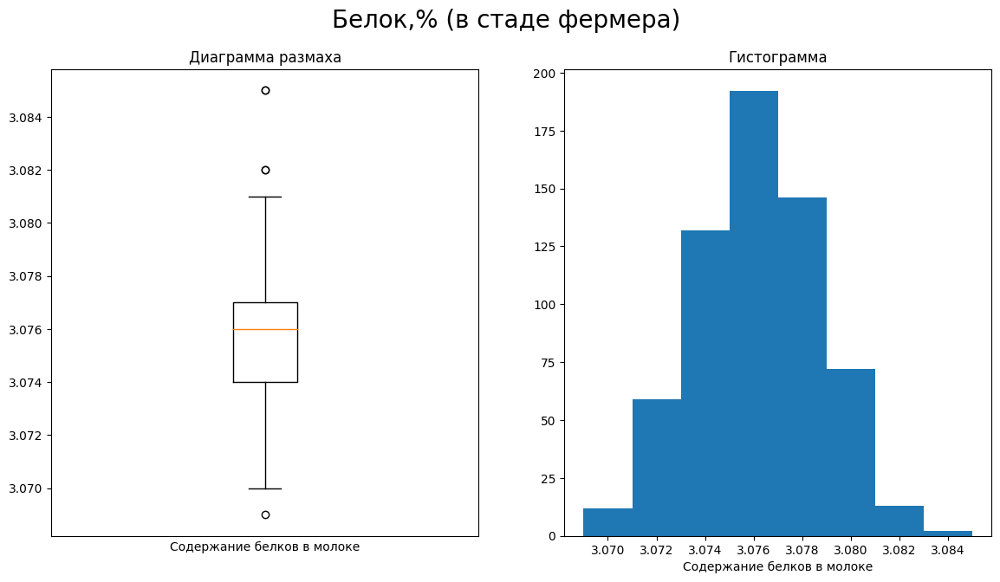

In [37]:
box_hist_plot(ferma_main, 'protein_per', 'Белок,% (в стаде фермера)', 'Содержание белков в молоке', 8)

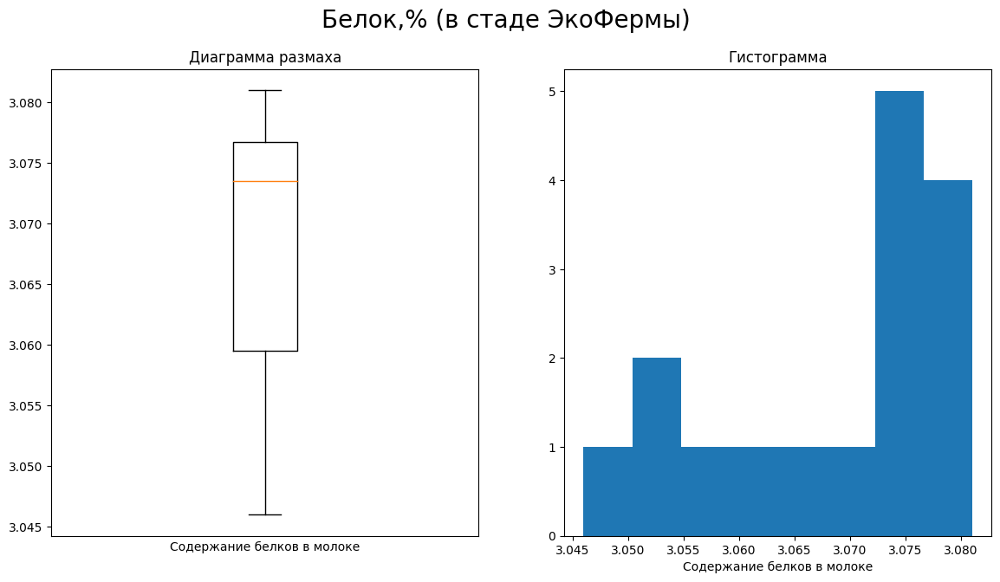

In [38]:
box_hist_plot(cow_buy, 'protein_per', 'Белок,% (в стаде ЭкоФермы)', 'Содержание белков в молоке', 8)

В проценту содержания белка в молоке коровы фермера распределены нормально, а у Экофермы - ассиметрично со смещением вправо. 

В среднем молоко коров фермера содержит больше белка. 

### Категориальные признаки

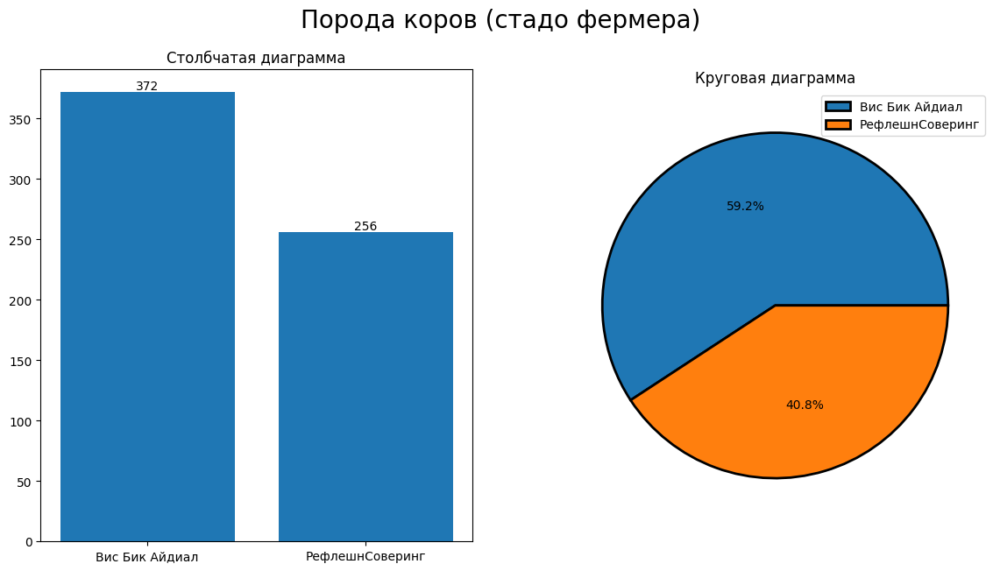

In [39]:
bar_round_plot(ferma_main, 'breed', 'Порода коров (стадо фермера)')

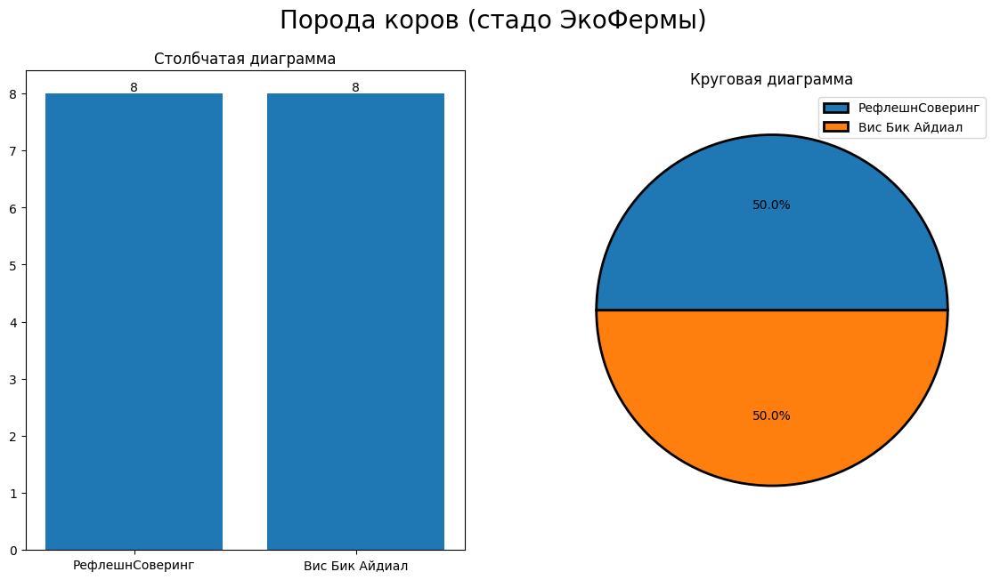

In [40]:
bar_round_plot(cow_buy, 'breed', 'Порода коров (стадо ЭкоФермы)')

В стаде Вольного луга преобладают коровы породы Вис Бик Айдиал, а в стаде ЭкоФермы - поровну. 

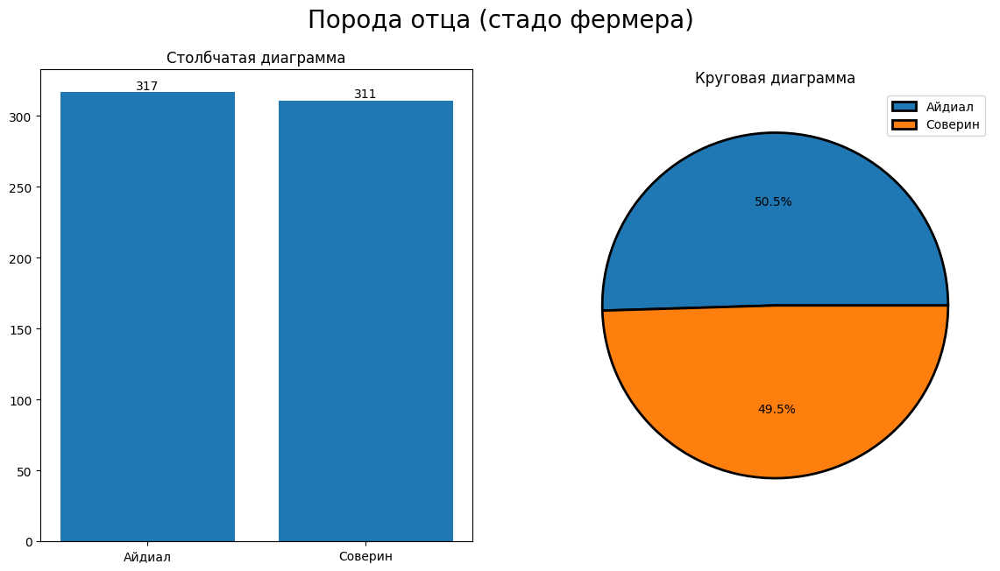

In [41]:
bar_round_plot(ferma_main, 'breed_dad', 'Порода отца (стадо фермера)')

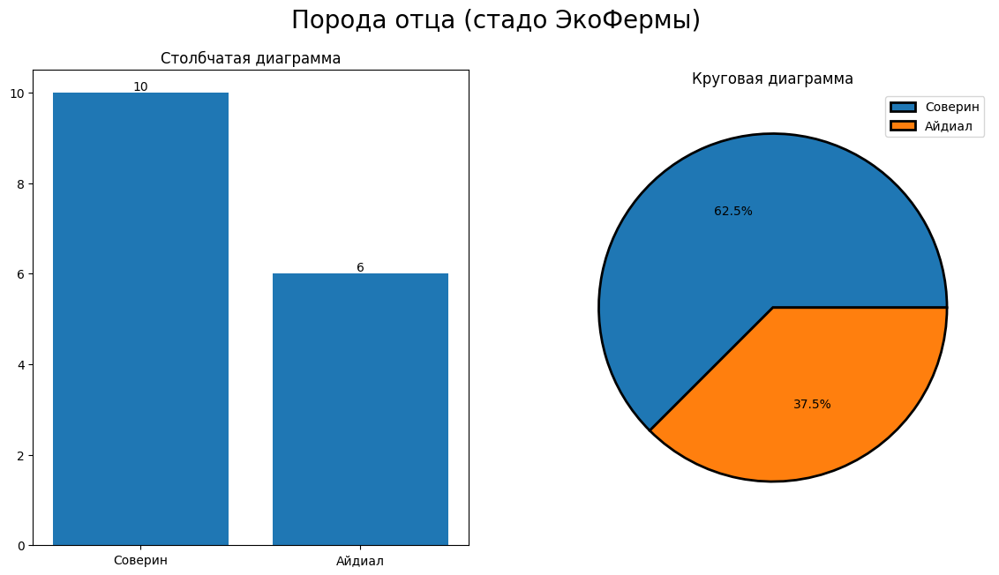

In [42]:
bar_round_plot(cow_buy, 'breed_dad', 'Порода отца (стадо ЭкоФермы)')

В стаде Вольного луга быки-отцы делятся примерно на две равные по поголовью породы. Однако, в стаде ЭкоФермы преобладают быки породы Соверин. 

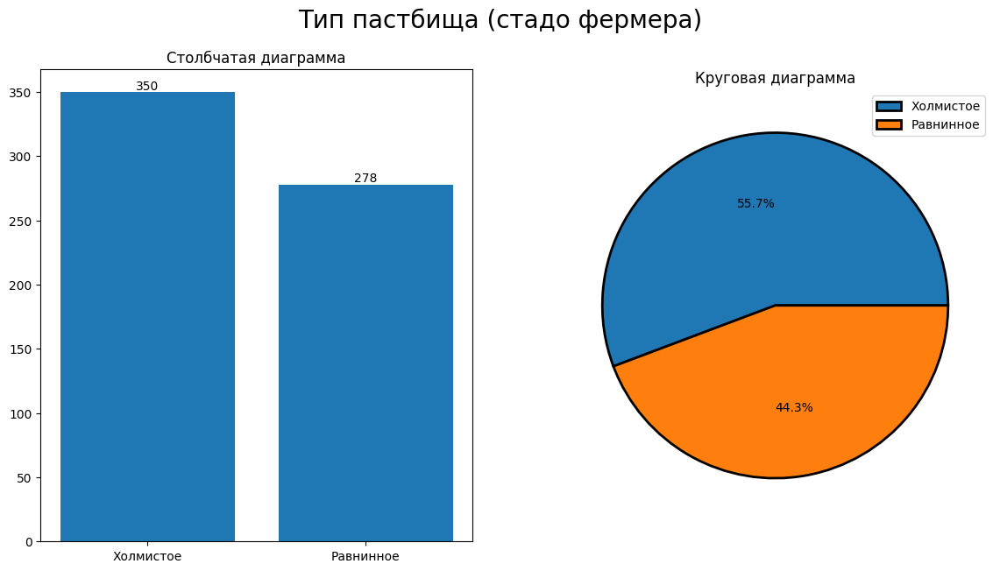

In [43]:
bar_round_plot(ferma_main, 'pasture', 'Тип пастбища (стадо фермера)')

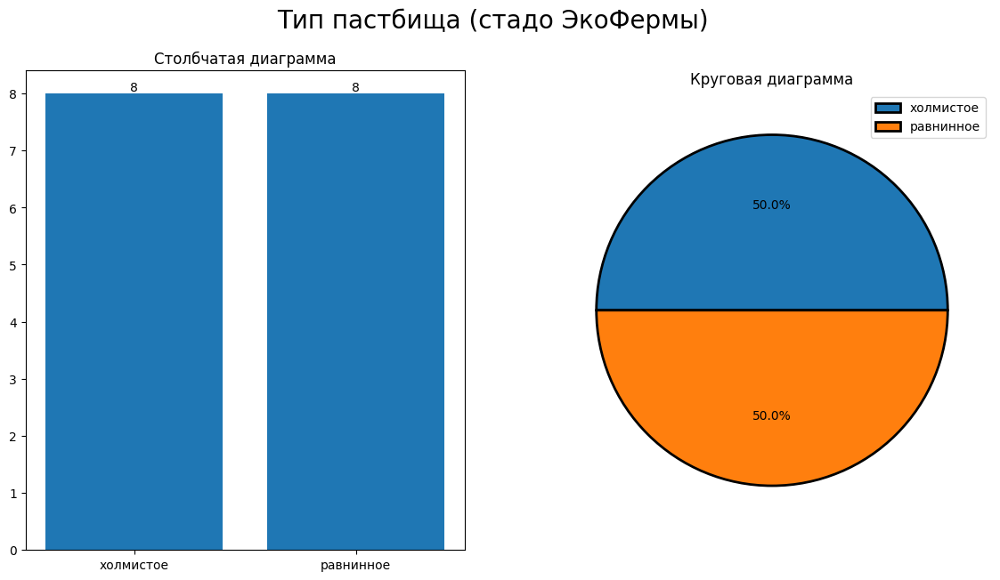

In [44]:
bar_round_plot(cow_buy, 'pasture', 'Тип пастбища (стадо ЭкоФермы)')

Примерно на равные части делятся стада ЭкоФермы и Вольного луга по типу пастбища. 

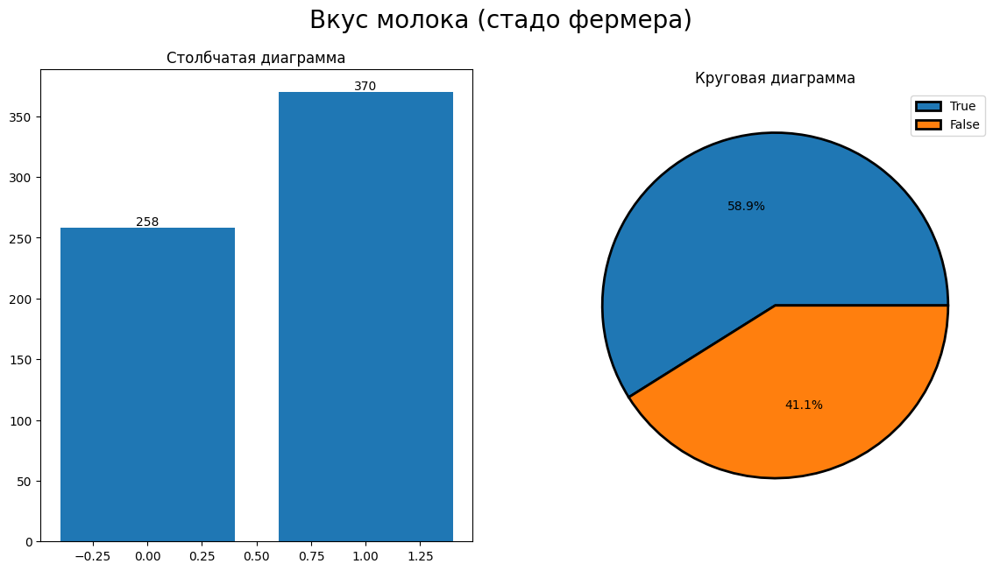

In [45]:
bar_round_plot(ferma_main, 'taste', 'Вкус молока (стадо фермера)')

Коров, дающих вкусное молоко у фермера больше. Однако, по данному показателю есть куда стремиться. 

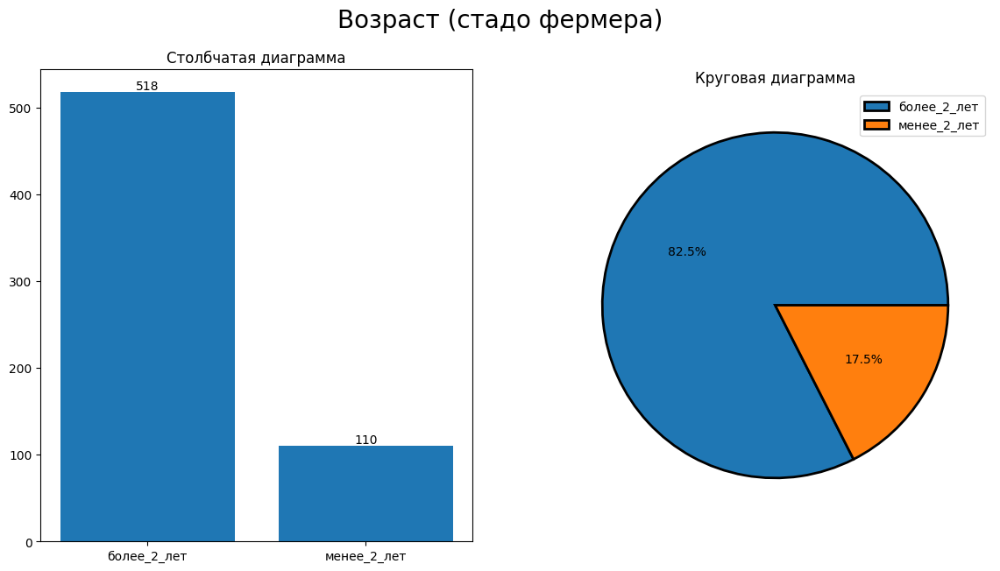

In [46]:
bar_round_plot(ferma_main, 'age', 'Возраст (стадо фермера)')

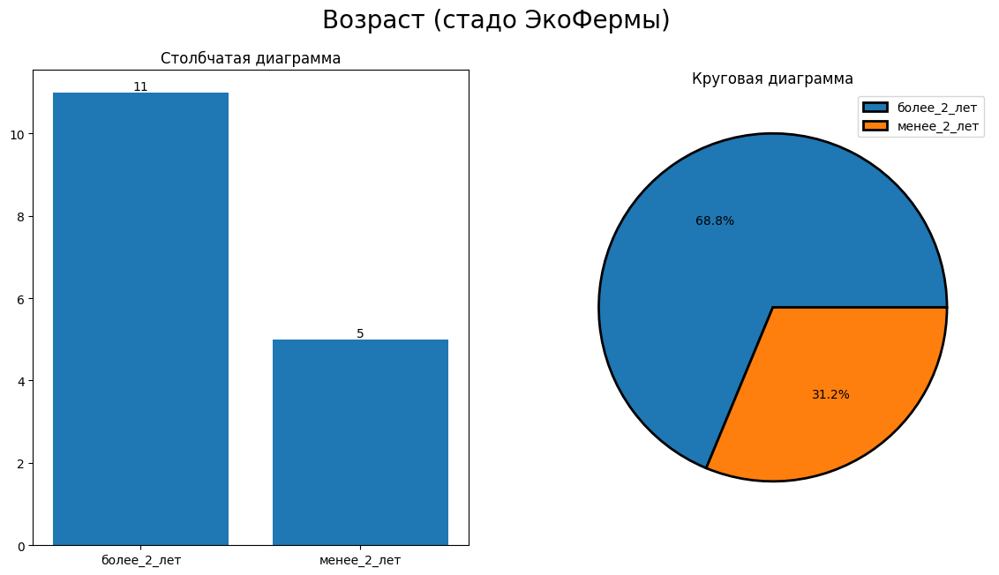

In [47]:
bar_round_plot(cow_buy, 'age', 'Возраст (стадо ЭкоФермы)')

### Выводы по исследовательскому анализу

Таким образом, рассмотрев количественные и качественные признаки, можно сделать вывод, что стада распределены по показателям примерно одинаково. Из особенностей: 
- В стаде Вольного луга быки-отцы делятся примерно на две равные по поголовью породы. Однако, в стаде ЭкоФермы преобладают быки породы Соверин. 
- стадо "ЭкоФермы" моложе, в нем концентрация коров в возрасте менее 2 лет составляет 31%, в то время как в стаде "Вольного луга" таких коров 17,5%. 

## Корреляционный анализ

### Корреляционная матрица количественных признаков

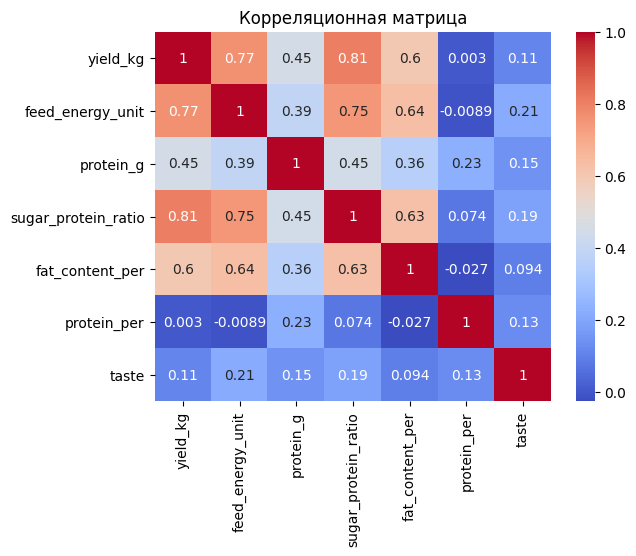

In [48]:
correlation_matrix = ferma_main.drop('id', axis=1).corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Корреляционная матрица')
plt.show()

Наибольшая корреляция у показателя "Удой" наблюдается с характеристиками корма. 
Показатель жирности молока скорее следствие показателя удоя молока.  

### Матрица рассеяния (без учета категориальных признаков)

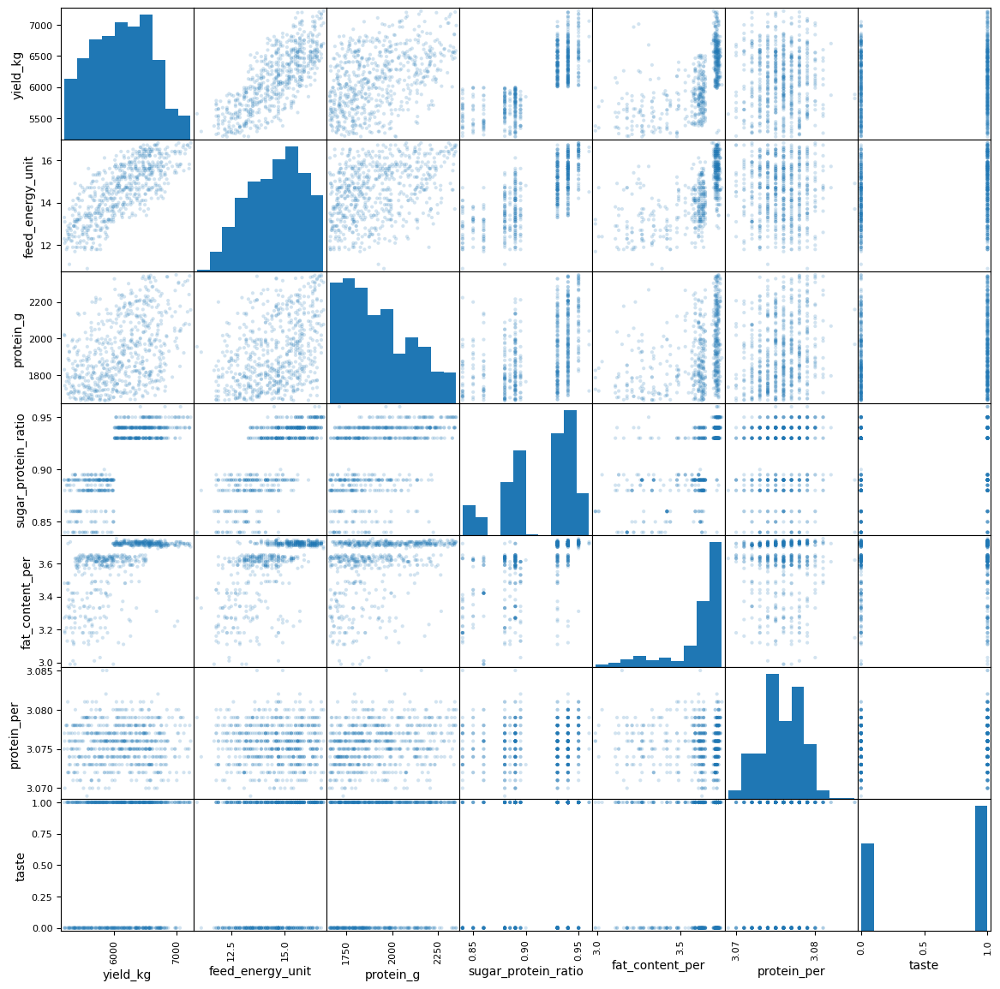

In [49]:
scatter_data = ferma_main.drop('id', axis=1)
scatter_data['taste'] = scatter_data['taste'].astype('int')
pd.plotting.scatter_matrix(scatter_data, alpha=0.2, figsize=(14, 14))
plt.show()

С показателем "Удой" больше всего коррелируют характеристики корма: 
- ЭКЕ,
- количество граммов чистого протеина
- СПО.

### Матрицы рассеяния (с учетом категориальных признаков)

#### Вкус молока

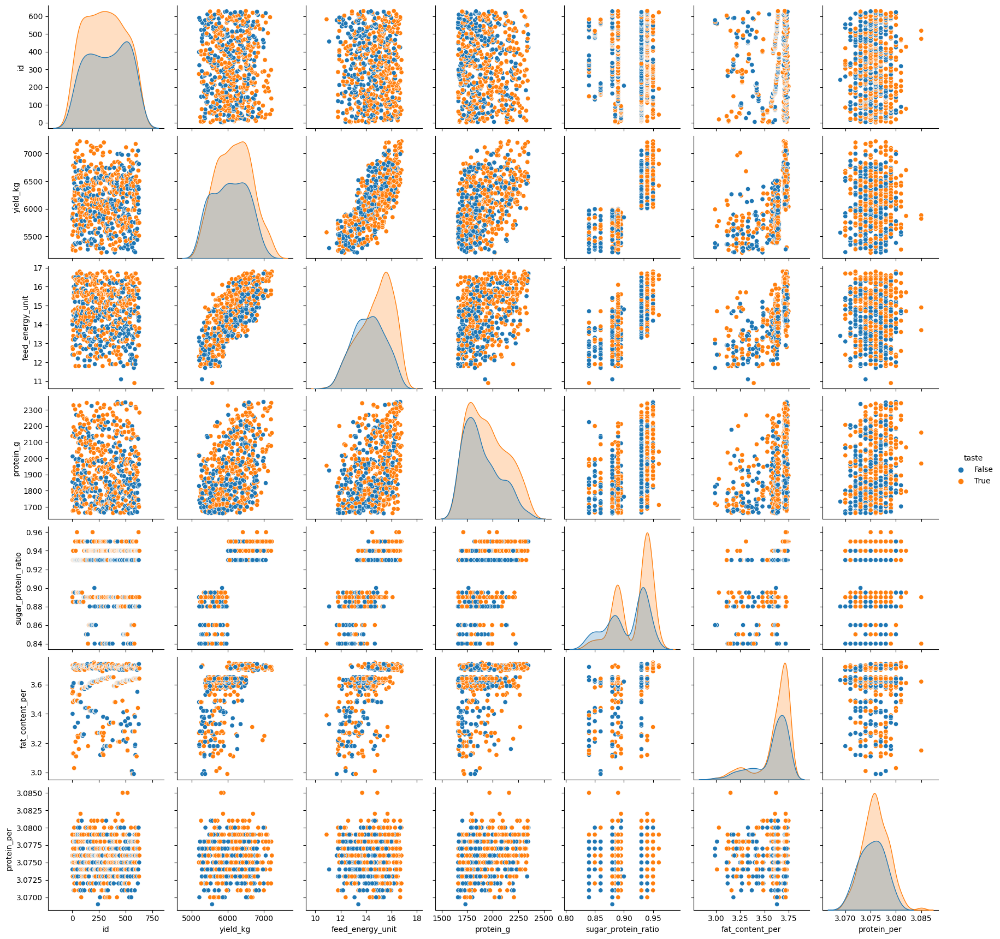

In [50]:
sns.pairplot(ferma_main, hue="taste")

Чем выше показатели ЭКЕ, сырого протеина, СПО, тем чаще молоко оказывается в категории "вкусное" и тем больше удой. 

#### Тип пастбища

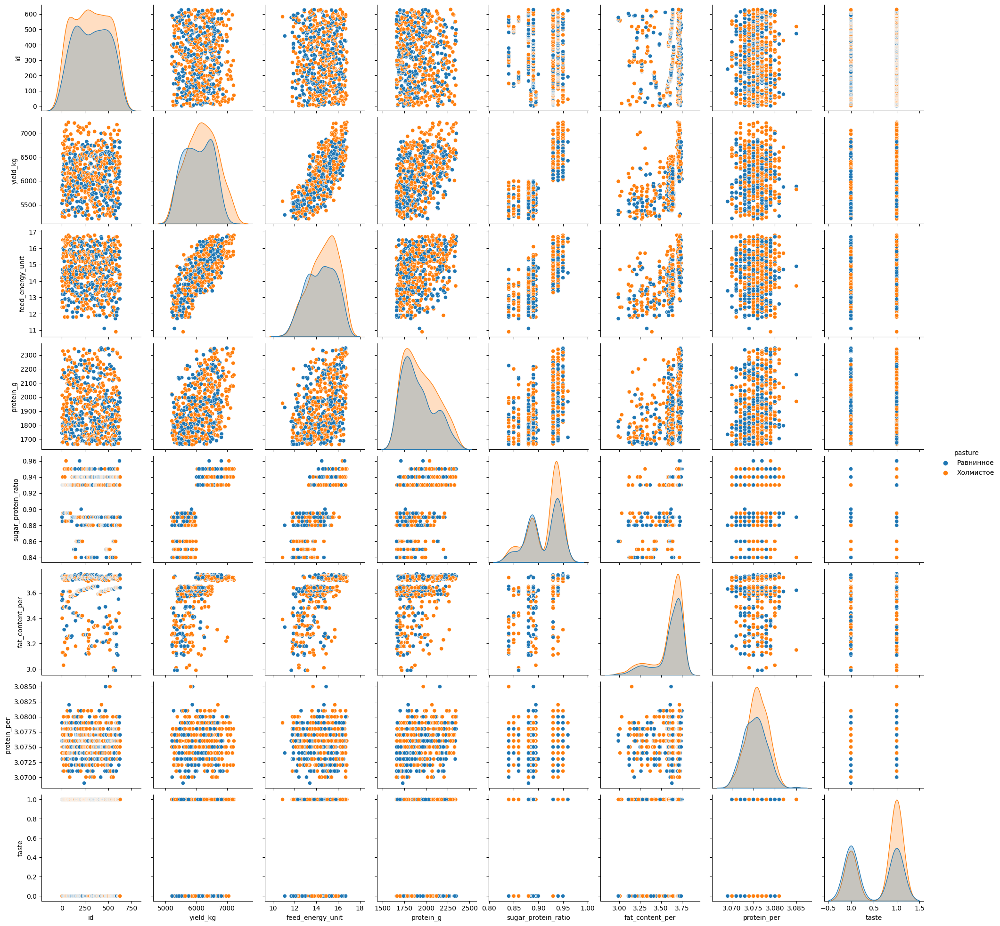

In [51]:
sns.pairplot(ferma_main, hue="pasture")

Коровы, которые паслись на холмах и получали в корме больше ЭКЕ, сырого протеина, СПО, дают большие показатели удоя. 

#### Возраст коровы

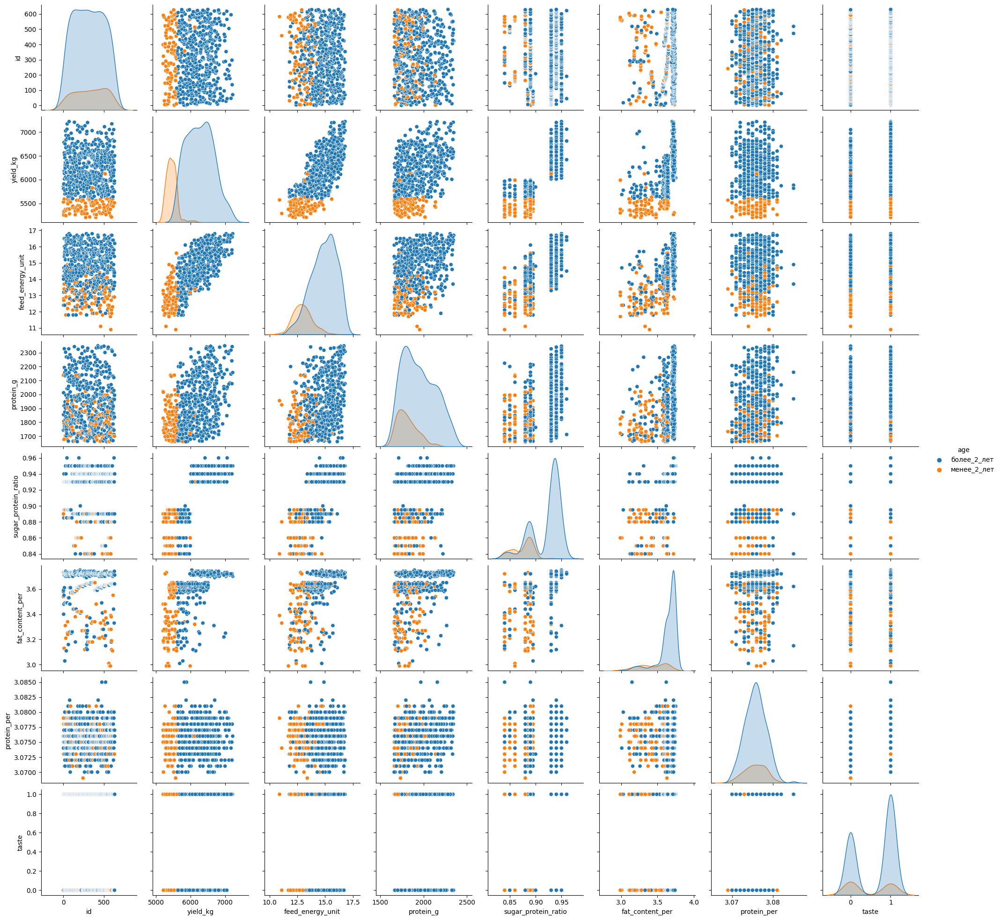

In [52]:
sns.pairplot(ferma_main, hue="age")

Молодые коровы в возрасте менее 2 лет имеют низкие значения показателя удоя.

#### Порода коровы

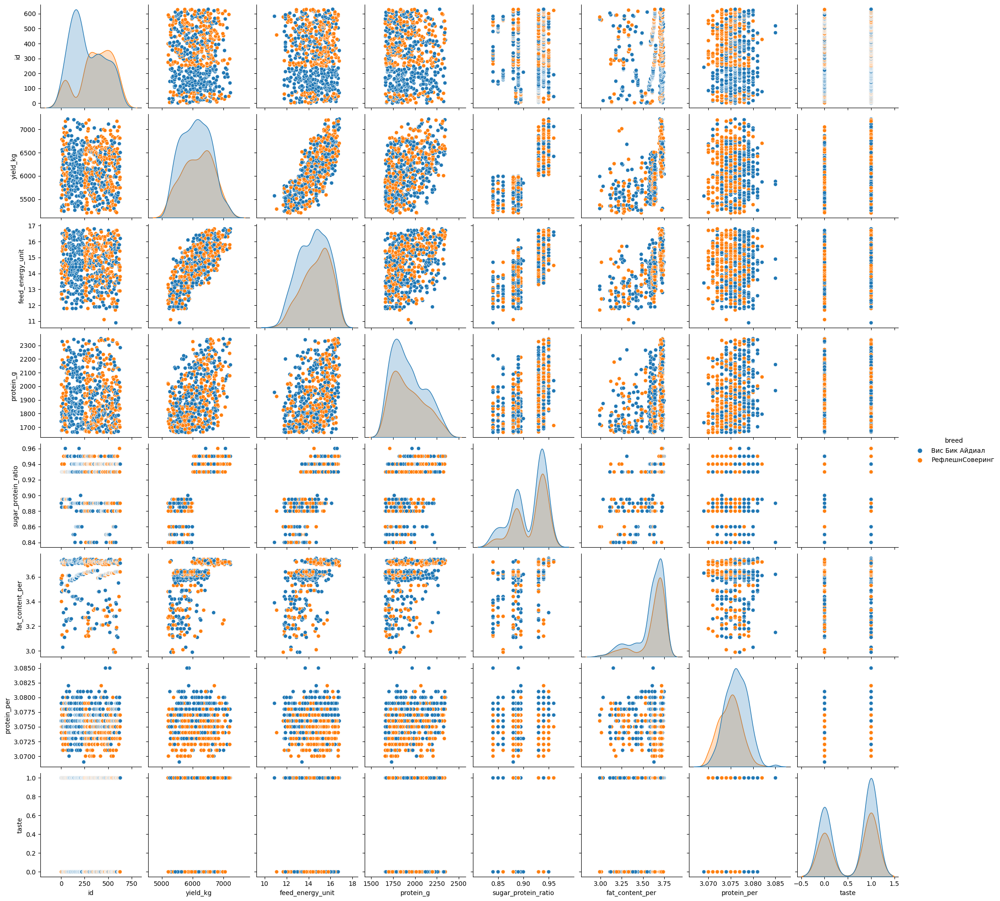

In [53]:
sns.pairplot(ferma_main, hue="breed")

Коровы породы РефлешнСоверинг дают больше молока, чем Вис Бик Айдиал. Однако, точное/абсолютное преобладание определить нельзя. 

#### Порода папы коровы

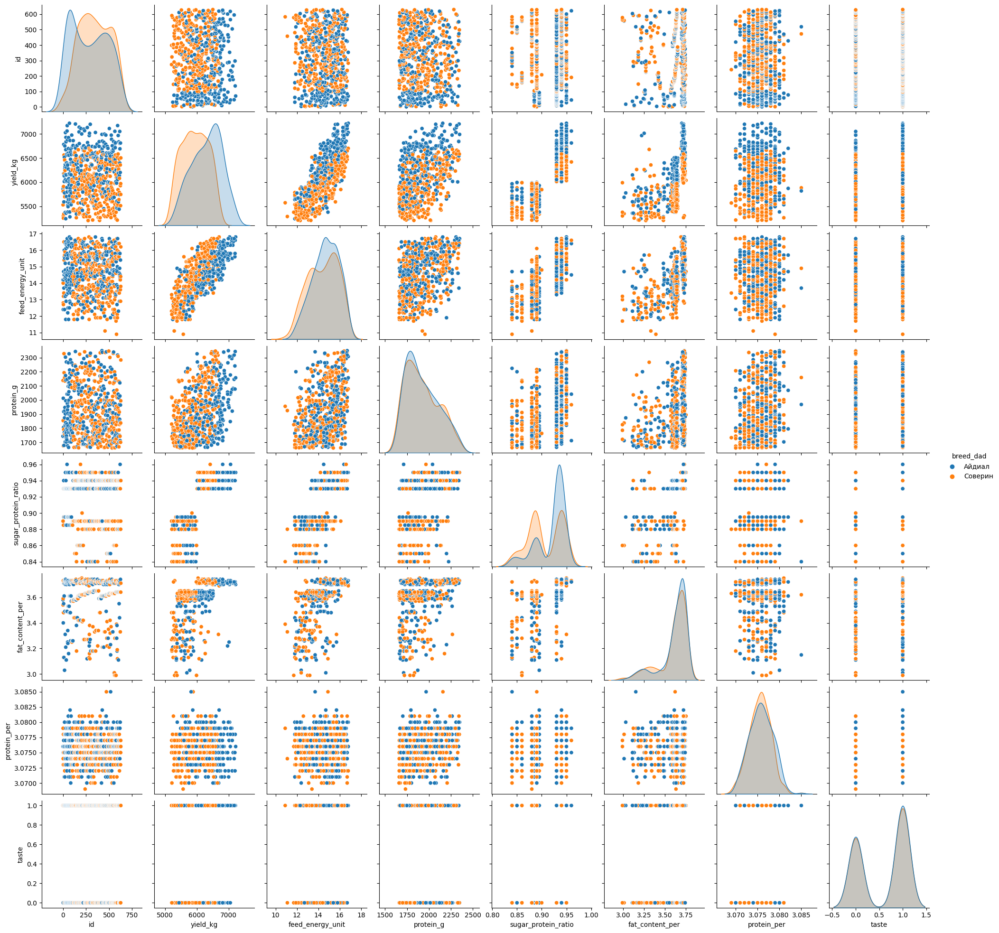

In [54]:
sns.pairplot(ferma_main, hue="breed_dad")

Коровы, чей бык-отец был породы Айдиал, дают больше молока. 

### Выводы по корреляционному анализу

Таким образом, в результате проведения корреляционного анализа можно сделать следующие выводы:

- Количественные показатели, которые больше всего оказывают влияние на удой коров: ЭКЕ в корме, количество чистого протеина в корме, СПО корма.
- Качественные показатели, которые больше всего оказывают влияние на удой коров: возраст коровы (нужна старше 2 лет), тип пастбища (нужно холмистое), порода папы-быка (нужен Айдиал).

- Признаки, которые не коррелируют с целевой переменной "удой": жирность молока (%), содержание белков в молоке (%), вкус молока, порода коровы. 

## Обучение модели линейной регрессии №1

Характеристики молока, не влияющие на показатели годового удоя коровы:

- `fat_content_per`
- `protein_per`
- `taste`

Перечисленные показатели и столбец `id` необходимо убрать из признаков для обучения модели линейной регрессии .

In [55]:
ferma_main_learning_1 = ferma_main.drop(['fat_content_per','protein_per','taste','id'], axis=1)

In [56]:
# сохранение входных признаков в переменную X
X_1 = ferma_main_learning_1.drop('yield_kg', axis=1)

# сохранение целевого признака в переменную y
y_1 = ferma_main_learning_1['yield_kg'] 

In [57]:
# разделение на тренировочную и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X_1, y_1, random_state=RANDOM_STATE)

# вывод необходимых размерностей
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(471, 7)
(157, 7)
(471,)
(157,)


In [58]:
# Список всех категориальных признаков 
cat_col_names = ['breed', 'pasture', 'breed_dad', 'age']

# Список всех количественных признаков 
num_col_names = ['feed_energy_unit', 'protein_g', 'sugar_protein_ratio']

### Кодирование категориальных признаков с помощью `OneHotEncoder`

In [59]:
# создание переменной с экземпляром класса OneHotEncoder()
encoder = OneHotEncoder(drop='first', sparse=False)

# обучение и трансформация категориальных признаков из тренировочной выборки 
X_train_ohe = encoder.fit_transform(X_train[cat_col_names])

# преобразование категориальных признаков в тестовой выборке
X_test_ohe = encoder.transform(X_test[cat_col_names])

# список новых столбцов после кодирования
encoder_col_names = encoder.get_feature_names()

### Масштабирование количественных признаков с помощью `StandardScaler`

In [60]:
# создание переменной с экземпляром класса StandardScaler()
scaler = StandardScaler()

# обучение и трансформация количественных признаков из тренировочной выборки 
X_train_scaled = scaler.fit_transform(X_train[num_col_names])

# преобразование количественных признаков в тестовой выборке
X_test_scaled = scaler.transform(X_test[num_col_names])

### Тренировочный и тестовый датафреймы из закодированных и отмасштабированных данных

In [61]:
X_train_ohe = pd.DataFrame(X_train_ohe, columns=encoder_col_names)
X_test_ohe = pd.DataFrame(X_test_ohe, columns=encoder_col_names)

X_train_scaled = pd.DataFrame(X_train_scaled, columns=num_col_names)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=num_col_names)

# объединяем все преобразованные данные в тренировочный и тестовый датафреймы
X_train = pd.concat([X_train_ohe, X_train_scaled], axis=1)
X_test = pd.concat([X_test_ohe, X_test_scaled], axis=1)

print(X_train.head())

   x0_РефлешнСоверинг  x1_Холмистое  x2_Соверин  x3_менее_2_лет  \
0                 1.0           1.0         1.0             0.0   
1                 1.0           1.0         1.0             1.0   
2                 0.0           0.0         0.0             0.0   
3                 0.0           1.0         0.0             0.0   
4                 0.0           0.0         0.0             0.0   

   feed_energy_unit  protein_g  sugar_protein_ratio  
0          1.502378   1.079523             0.837130  
1         -1.557270  -0.196920            -0.703660  
2          0.125537  -1.386085            -1.011818  
3         -0.103937   0.752230             0.837130  
4         -1.098323   0.828598            -0.703660  


### Обучение модели и получение предсказаний

In [62]:
# Инициализация модели линейной регрессии
model_lr_1  = LinearRegression()

# Обучение модели на тренировочных данных
model_lr_1.fit(X_train, y_train)

# Получение предсказания модели на тестовых данных 
predictions_1 = model_lr_1.predict(X_test)

### Расчет коэффициента детерминации и анализ остатков

In [63]:
# Коэффициент детерминации
r2_1 = r2_score(y_test, predictions_1)  
print(f"Коэффициент детерминации:{r2_1.round(4)}")

Коэффициент детерминации:0.7844


R² принимает значения от `−∞` до `1`. Чем ближе метрика к единице, тем лучше обобщающая способность модели и тем точнее будут предсказания. Значение коэффициента 0.78 означает, что модель хорошо себя показывает в 78% случаев. 

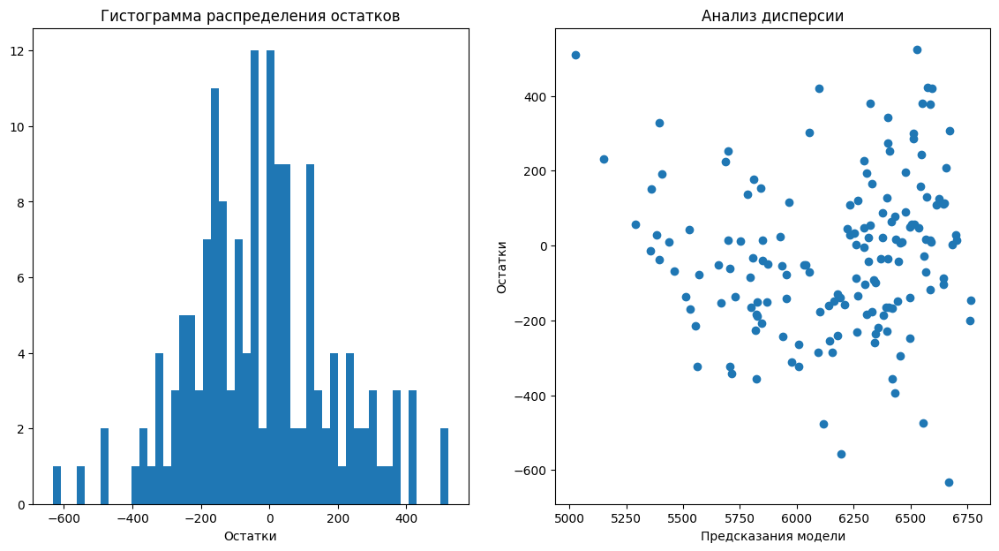

In [64]:
# Расчет остатков
residuals_1 = y_test - predictions_1

# Графики по количественным признакам — гистограмма распределения и диаграмма рассеяния
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14,7))
axes[0].hist(x=residuals_1, bins=50)
axes[0].set_title('Гистограмма распределения остатков')
axes[0].set_xlabel('Остатки')

axes[1].scatter(x=predictions_1, y=residuals_1)
axes[1].set_xlabel('Предсказания модели')
axes[1].set_ylabel('Остатки')
axes[1].set_title('Анализ дисперсии')
plt.show()

- Остатки распределены асимметрично нормально со смещением влево. Это означает, что прогнозы данной модели часто больше, чем истинные значения.
- Дисперсия остатков имеет больший разброс по мере увеличения прогногнозных значений. На диаграмме рассеяния виднеется «рупор». 

#### Метрики MAE, MSE, RMSE

In [65]:
mse_1 = mean_squared_error(y_test, predictions_1)
rmse_1 = mean_squared_error(y_test, predictions_1, squared=False)
mae_1 = mean_absolute_error(y_test, predictions_1)

print('MSE (модель №1): ', mse_1)
print('RMSE (модель №1): ', rmse_1)
print('MAE (модель №1): ', mae_1)

MSE (модель №1):  43887.01500966049
RMSE (модель №1):  209.49227911706075
MAE (модель №1):  164.2419446347492


## Обучение модели линейной регрессии №2

### Преобразование столбца `СПО`

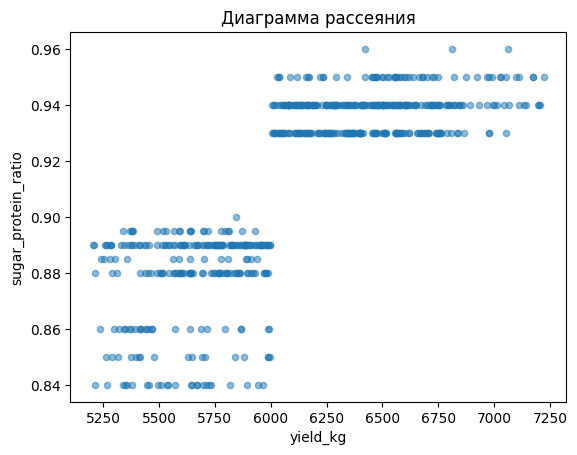

In [66]:
ferma_main.plot(kind='scatter', x='yield_kg', y='sugar_protein_ratio', alpha=0.5, title='Диаграмма рассеяния')
plt.show()

Признаки СПО и Удой связаны нелинейно. На представленной диаграмме рассеяния данные сгруппированы на 2 кластера (до 0.91 и после). Преобразуем признак СПО из количественного в категориальный. 

In [67]:
ferma_main_learning_2 = ferma_main_learning_1
ferma_main_learning_2['sugar_protein_ratio'] = ferma_main_learning_2['sugar_protein_ratio'].apply(lambda x: 'до 0.91 вкл' if x <= 0.91 else 'более 0.91')

### Преобразование столбца `ЭКЕ`

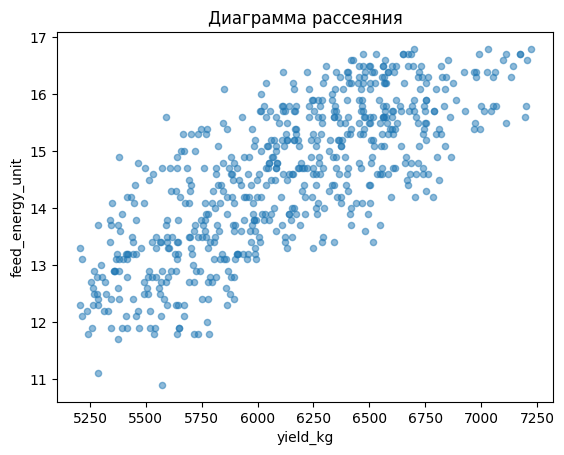

In [68]:
ferma_main.plot(kind='scatter', x='yield_kg', y='feed_energy_unit', alpha=0.5, title='Диаграмма рассеяния')
plt.show()

Признаки ЭКЕ и Удой связаны нелинейно. Нелинейность между ними можно исключить, если ввести новый признак `ЭКЕ в квадрате`.

In [69]:
ferma_main_learning_2['feed_energy_unit'] = ferma_main_learning_2['feed_energy_unit'].apply(lambda x: x**2)

### Обучение модели линейной регрессии на обновленных данных 

In [70]:
# сохранение входных признаков в переменную X
X_2 = ferma_main_learning_2.drop('yield_kg', axis=1)

# сохранение целевого признака в переменную y
y_2 = ferma_main_learning_2['yield_kg'] 

# разделение на тренировочную и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X_2, y_2, random_state=RANDOM_STATE)

# Список всех категориальных признаков 
cat_col_names = ['sugar_protein_ratio', 'breed', 'pasture', 'breed_dad', 'age']

# Список всех количественных признаков 
num_col_names = ['feed_energy_unit', 'protein_g']

# создание переменной с экземпляром класса OneHotEncoder()
encoder = OneHotEncoder(drop='first', sparse=False)

# обучение и трансформация категориальных признаков из тренировочной выборки 
X_train_ohe = encoder.fit_transform(X_train[cat_col_names])

# преобразование категориальных признаков в тестовой выборке
X_test_ohe = encoder.transform(X_test[cat_col_names])

# список новых столбцов после кодирования
encoder_col_names = encoder.get_feature_names()

# создание переменной с экземпляром класса StandardScaler()
scaler = StandardScaler()

# обучение и трансформация количественных признаков из тренировочной выборки 
X_train_scaled = scaler.fit_transform(X_train[num_col_names])

# преобразование количественных признаков в тестовой выборке
X_test_scaled = scaler.transform(X_test[num_col_names])

X_train_ohe = pd.DataFrame(X_train_ohe, columns=encoder_col_names)
X_test_ohe = pd.DataFrame(X_test_ohe, columns=encoder_col_names)

X_train_scaled = pd.DataFrame(X_train_scaled, columns=num_col_names)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=num_col_names)

# объединяем все преобразованные данные в тренировочный и тестовый датафреймы
X_train = pd.concat([X_train_ohe, X_train_scaled], axis=1)
X_test = pd.concat([X_test_ohe, X_test_scaled], axis=1)

# Инициализация модели линейной регрессии
model_lr_2  = LinearRegression()

# Обучение модели на тренировочных данных
model_lr_2.fit(X_train, y_train)

# Получение предсказания модели на тестовых данных 
predictions_2 = model_lr_2.predict(X_test)

In [71]:
# Коэффициент детерминации
r2_2 = r2_score(y_test, predictions_2)  
print(f"Коэффициент детерминации:{r2_2.round(4)}")

Коэффициент детерминации:0.8181


Значение коэффициента детерминации первой модели 0.78, а у второй - 0.82. Это означает, что в рещзультате преобразований столбцов СПО и ЭКЕ удалось увеличить точность предсказаний модели на 4%, так как чем ближе метрика к единице, тем лучше обобщающая способность модели и тем точнее будут предсказания. 

Вторая модель хорошо себя показывает в 82% случаев. 

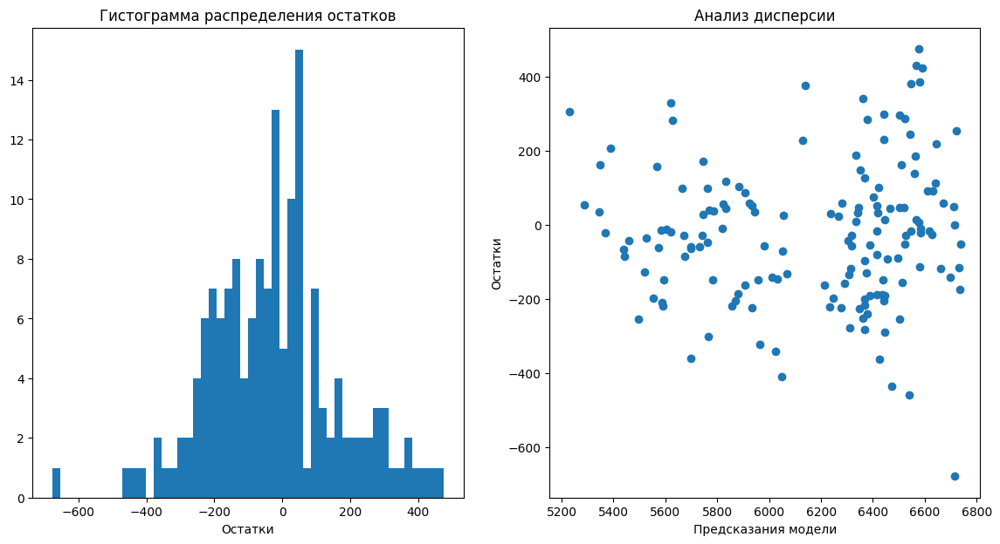

In [72]:
# Расчет остатков
residuals_2 = y_test - predictions_2

# Графики по количественным признакам — гистограмма распределения и диаграмма рассеяния
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14,7))
axes[0].hist(x=residuals_2, bins=50)
axes[0].set_title('Гистограмма распределения остатков')
axes[0].set_xlabel('Остатки')

axes[1].scatter(x=predictions_2, y=residuals_2)
axes[1].set_xlabel('Предсказания модели')
axes[1].set_ylabel('Остатки')
axes[1].set_title('Анализ дисперсии')
plt.show()

- Остатки распределены асимметрично нормально со смещением влево. Однако смещение удалось сократить. Это означает, что прогнозы данной модели часто больше, чем истинные значения, но амплитуду ошибок удалось сократить.
- Дисперсия остатков имеет разброс по мере увеличения прогногнозных значений. Однако, разброс удалось сократить по сравнению с первой моделью. "Рупор" на диаграмме рассеяния менее заметен. 

#### Метрики MAE, MSE, RMSE

In [73]:
mse_2 = mean_squared_error(y_test, predictions_2)
rmse_2 = mean_squared_error(y_test, predictions_2, squared=False)
mae_2 = mean_absolute_error(y_test, predictions_2)

print('MSE (модель №2): ', mse_2)
print('RMSE (модель №2): ', rmse_2)
print('MAE (модель №2): ', mae_2)

MSE (модель №2):  37030.91131113694
RMSE (модель №2):  192.4341739690145
MAE (модель №2):  149.03965222364602


## Обучение модели линейной регрессии №3

Добавление столбца `"Имя папы быка"`

In [74]:
ferma_main = ferma_main.merge(ferma_dad, on='id', how='left')

Удаление лишних столбцов 

In [75]:
ferma_main_learning_3 = ferma_main.drop(['fat_content_per','protein_per','taste','id'], axis=1)

Преобразование столбца `СПО` в категориальный

In [76]:
ferma_main_learning_3['sugar_protein_ratio'] = ferma_main_learning_3['sugar_protein_ratio'].apply(lambda x: 'до 0.91 вкл' if x <= 0.91 else 'более 0.91')

In [77]:
# сохранение входных признаков в переменную X
X_3 = ferma_main_learning_3.drop('yield_kg', axis=1)

# сохранение целевого признака в переменную y
y_3 = ferma_main_learning_2['yield_kg'] 

# разделение на тренировочную и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X_3, y_3, random_state=RANDOM_STATE)

# Список всех категориальных признаков 
cat_col_names = ['sugar_protein_ratio', 'breed', 'pasture', 'breed_dad', 'age', 'name_dad']

# Список всех количественных признаков 
num_col_names = ['feed_energy_unit', 'protein_g']

# создание переменной с экземпляром класса OneHotEncoder()
encoder = OneHotEncoder(drop='first', sparse=False)

# обучение и трансформация категориальных признаков из тренировочной выборки 
X_train_ohe = encoder.fit_transform(X_train[cat_col_names])

# преобразование категориальных признаков в тестовой выборке
X_test_ohe = encoder.transform(X_test[cat_col_names])

# список новых столбцов после кодирования
encoder_col_names = encoder.get_feature_names()

# создание переменной с экземпляром класса StandardScaler()
scaler = StandardScaler()

# обучение и трансформация количественных признаков из тренировочной выборки 
X_train_scaled = scaler.fit_transform(X_train[num_col_names])

# преобразование количественных признаков в тестовой выборке
X_test_scaled = scaler.transform(X_test[num_col_names])

X_train_ohe = pd.DataFrame(X_train_ohe, columns=encoder_col_names)
X_test_ohe = pd.DataFrame(X_test_ohe, columns=encoder_col_names)

X_train_scaled = pd.DataFrame(X_train_scaled, columns=num_col_names)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=num_col_names)

# объединяем все преобразованные данные в тренировочный и тестовый датафреймы
X_train = pd.concat([X_train_ohe, X_train_scaled], axis=1)
X_test = pd.concat([X_test_ohe, X_test_scaled], axis=1)

# Инициализация модели линейной регрессии
model_lr_3  = LinearRegression()

# Обучение модели на тренировочных данных
model_lr_3.fit(X_train, y_train)

# Получение предсказания модели на тестовых данных 
predictions_3 = model_lr_3.predict(X_test)

In [78]:
# Коэффициент детерминации
r2_3 = r2_score(y_test, predictions_3)  
print(f"Коэффициент детерминации:{r2_3.round(4)}")

Коэффициент детерминации:0.8233


Значение коэффициента детерминации второй модели 0.818, а у третьей - 0.823. Это означает, что в результате добавления столбца "имя папы быка" удалось увеличить точность предсказания модели на 0,5%, так как чем ближе метрика к единице, тем лучше обобщающая способность модели и тем точнее будут предсказания. 

Третья модель хорошо себя показывает в 82,3% случаев. 

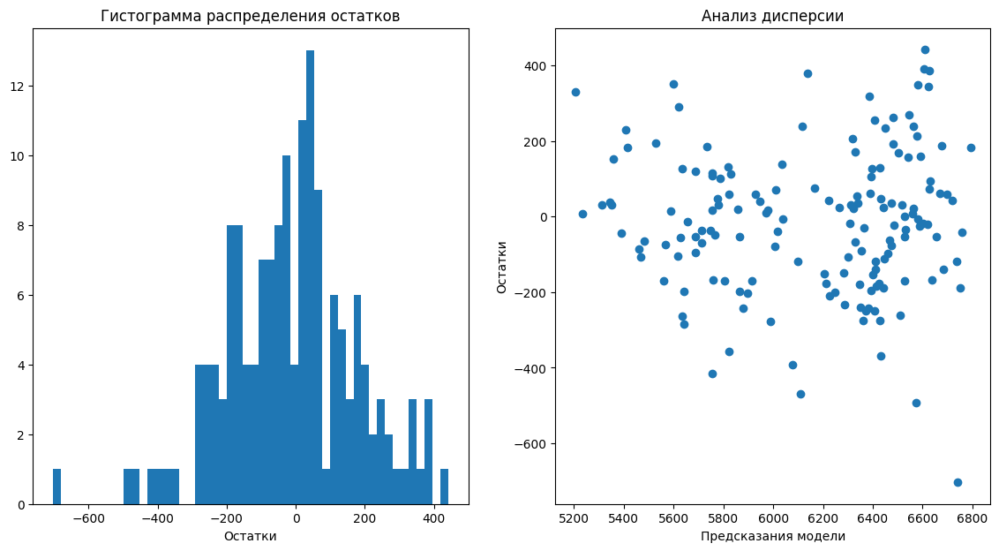

In [79]:
# Расчет остатков
residuals_3 = y_test - predictions_3

# Графики по количественным признакам — гистограмма распределения и диаграмма рассеяния
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14,7))
axes[0].hist(x=residuals_3, bins=50)
axes[0].set_title('Гистограмма распределения остатков')
axes[0].set_xlabel('Остатки')

axes[1].scatter(x=predictions_3, y=residuals_3)
axes[1].set_xlabel('Предсказания модели')
axes[1].set_ylabel('Остатки')
axes[1].set_title('Анализ дисперсии')
plt.show()

- Остатки распределены асимметрично нормально со смещением влево. Однако смещение удалось незначительно сократить. Распределение остатков схоже с остатками второй модели. 
- Дисперсия остатков имеет разброс по мере увеличения прогногнозных значений. Однако, разброс удалось сократить. Схоже со второй моделью. 

#### Метрики MAE, MSE, RMSE

In [80]:
mse_3 = mean_squared_error(y_test, predictions_3)
rmse_3 = mean_squared_error(y_test, predictions_3, squared=False)
mae_3 = mean_absolute_error(y_test, predictions_3)

print('MSE (модель №3): ', mse_3)
print('RMSE (модель №3): ', rmse_3)
print('MAE (модель №3): ', mae_3)

MSE (модель №3):  35969.441436293746
RMSE (модель №3):  189.65611362751727
MAE (модель №3):  146.71303618512138


### Сравнение показателей моделей линейной регрессии

In [81]:
models = pd.DataFrame({'R2': [r2_1,r2_2,r2_3], 'MSE': [mse_1,mse_2,mse_3], 'RMSE': [rmse_1,rmse_2,rmse_3], 'MAE': [mae_1,mae_2,mae_3]})

In [82]:
models

,R2,MSE,RMSE,MAE
0,0.784408,43887.015010,209.492279,164.241945
1,0.818088,37030.911311,192.434174,149.039652
2,0.823302,35969.441436,189.656114,146.713036


Таким образом, лучше всего проявила себя модель №3. Её и будем использовать для составления прогноза. 

### Прогноз удоя коров ЭкоФермы

#### Подготовка данных

In [83]:
# Добавление недостающих столбцов
cow_buy['feed_energy_unit'] = ferma_main['feed_energy_unit'].mean() * 1.05
cow_buy['protein_g'] = ferma_main['protein_g'].mean() * 1.05
cow_buy['sugar_protein_ratio'] = ferma_main['sugar_protein_ratio'].mean() * 1.05

In [84]:
# Перевод первой буквы в столбце pasture в верхний регистр
cow_buy['pasture'] = cow_buy['pasture'].str.capitalize()

In [85]:
# Преобразование столбца `СПО` в категориальный
cow_buy_for_predict = cow_buy
cow_buy_for_predict['sugar_protein_ratio'] = cow_buy_for_predict['sugar_protein_ratio'].apply(lambda x: 'до 0.91 вкл' if x <= 0.91 else 'более 0.91')

In [86]:
# Удаление лишних столбцов
cow_buy_for_predict = cow_buy_for_predict.drop(['fat_content_per','protein_per'], axis=1)

In [87]:
# Список всех категориальных признаков 
cat_col_names = ['sugar_protein_ratio', 'breed', 'pasture', 'breed_dad', 'age', 'name_dad']

# # Список всех количественных признаков 
num_col_names = ['feed_energy_unit', 'protein_g']

# преобразование категориальных признаков
cow_buy_for_predict_ohe = encoder.transform(cow_buy_for_predict[cat_col_names])

# список новых столбцов после кодирования
encoder_col_names = encoder.get_feature_names()

# преобразование количественных признаков
cow_buy_for_predict_scaled = scaler.transform(cow_buy_for_predict[num_col_names])

cow_buy_for_predict_ohe = pd.DataFrame(cow_buy_for_predict_ohe, columns=encoder_col_names)

cow_buy_for_predict_scaled = pd.DataFrame(cow_buy_for_predict_scaled, columns=num_col_names)

# объединяем все преобразованные данные в тренировочный и тестовый датафреймы
cow_buy_for_predict = pd.concat([cow_buy_for_predict_ohe, cow_buy_for_predict_scaled], axis=1)

# Получение предсказания модели на тестовых данных 
cow_buy['yield_kg'] = model_lr_3.predict(cow_buy_for_predict)

In [88]:
cow_buy

,breed,pasture,breed_dad,name_dad,fat_content_per,protein_per,age,feed_energy_unit,protein_g,sugar_protein_ratio,yield_kg
0,Вис Бик Айдиал,Холмистое,Айдиал,Геркулес,3.58,3.076,более_2_лет,15.276162,2019.947532,более 0.91,6615.624911
1,Вис Бик Айдиал,Равнинное,Соверин,Буйный,3.54,3.081,менее_2_лет,15.276162,2019.947532,более 0.91,6387.063527
2,РефлешнСоверинг,Равнинное,Соверин,Барин,3.59,3.074,более_2_лет,15.276162,2019.947532,более 0.91,6289.017914
3,РефлешнСоверинг,Холмистое,Айдиал,Буйный,3.40,3.061,более_2_лет,15.276162,2019.947532,более 0.91,6596.793470
4,РефлешнСоверинг,Равнинное,Айдиал,Буйный,3.64,3.074,более_2_лет,15.276162,2019.947532,более 0.91,6544.815831
5,РефлешнСоверинг,Равнинное,Соверин,Геркулес,3.63,3.053,менее_2_лет,15.276162,2019.947532,более 0.91,6437.724518
7,Вис Бик Айдиал,Равнинное,Соверин,Буйный,3.57,3.079,более_2_лет,15.276162,2019.947532,более 0.91,6575.743015
9,РефлешнСоверинг,Холмистое,Айдиал,Буйный,3.40,3.079,менее_2_лет,15.276162,2019.947532,более 0.91,6408.113982
10,Вис Бик Айдиал,Холмистое,Соверин,Соловчик,3.73,3.055,более_2_лет,15.276162,2019.947532,более 0.91,6349.511852
11,РефлешнСоверинг,Равнинное,Соверин,Геркулес,3.73,3.073,более_2_лет,15.276162,2019.947532,более 0.91,6626.404005


Таким образом, удалось получить прогноз удоя коров ЭкоФермы

## Обучение модели логистической регрессии

### Подготовка данных 

In [89]:
# Измененеие типа данных в столбце taste из булевого в целочисленный (бинарный)
ferma_main['taste'] = ferma_main['taste'].astype(int)

In [90]:
# Удаление лишнего столбца id
ferma_main_for_log_reg = ferma_main.drop('id', axis=1)

In [91]:
# Преобразование столбца `СПО` в категориальный
ferma_main_for_log_reg['sugar_protein_ratio'] = ferma_main_for_log_reg['sugar_protein_ratio'].apply(lambda x: 'до 0.91 вкл' if x <= 0.91 else 'более 0.91')

In [92]:
# сохранение входных признаков в переменную X
X_4 = ferma_main_for_log_reg.drop('taste', axis=1)

# сохранение целевого признака в переменную y
y_4 = ferma_main_for_log_reg['taste'] 

# разделение на тренировочную и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X_4, y_4, random_state=RANDOM_STATE)

# вывод необходимых размерностей
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

# Список всех категориальных признаков 
cat_col_names = ['sugar_protein_ratio', 'breed', 'pasture', 'breed_dad', 'age', 'name_dad']

# Список всех количественных признаков 
num_col_names = ['yield_kg', 'feed_energy_unit', 'protein_g', 'fat_content_per', 'protein_per']

(471, 11)
(157, 11)
(471,)
(157,)


In [93]:
# обучение и трансформация категориальных признаков из тренировочной выборки 
X_train_ohe = encoder.fit_transform(X_train[cat_col_names])

# преобразование категориальных признаков в тестовой выборке
X_test_ohe = encoder.transform(X_test[cat_col_names])

# список новых столбцов после кодирования
encoder_col_names = encoder.get_feature_names()

# обучение и трансформация количественных признаков из тренировочной выборки 
X_train_scaled = scaler.fit_transform(X_train[num_col_names])

# преобразование количественных признаков в тестовой выборке
X_test_scaled = scaler.transform(X_test[num_col_names])

X_train_ohe = pd.DataFrame(X_train_ohe, columns=encoder_col_names)
X_test_ohe = pd.DataFrame(X_test_ohe, columns=encoder_col_names)

X_train_scaled = pd.DataFrame(X_train_scaled, columns=num_col_names)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=num_col_names)

# объединяем все преобразованные данные в тренировочный и тестовый датафреймы
X_train = pd.concat([X_train_ohe, X_train_scaled], axis=1)
X_test = pd.concat([X_test_ohe, X_test_scaled], axis=1)

### Обучение модели

In [94]:
# Инициализация модели логистической регрессии
clf_1 = LogisticRegression()

# Обучение модели на тренировочных данных
clf_1 = clf_1.fit(X_train, y_train)

# Получение предсказания модели на тестовых данных 
predictions_clf_1 = clf_1.predict(X_test)

In [95]:
acc = accuracy_score(y_test, predictions_clf_1)
recall = recall_score(y_test, predictions_clf_1)
precision = precision_score(y_test, predictions_clf_1)

print('Accuracy: ', acc)
print('Recall: ', recall)
print('Precision: ', precision)

Accuracy:  0.6242038216560509
Recall:  0.8636363636363636
Precision:  0.6178861788617886


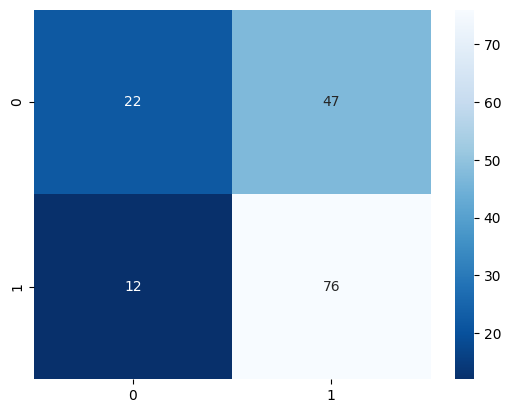

In [96]:
# Построение матрицы ошибок
cm = confusion_matrix(y_test, predictions_clf_1)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues_r');

Таким образом, матрица ошибок показывает:

- 22 случая модель пресказывает TN, то есть правильно отнесла невкусное молоко к категории "НЕвкусное"
- 47 случаев модель пресказывает FP, то есть отнесла невкусное молоко к категории "вкусное"
- 12 случев модель пресказывает FN, то есть отнесла вкусное молоко в категории "НЕвкусное"
- 76 случев модель пресказывает TP, то есть правильно определяет вкусное молоко к категории "вкусное"

Так как одним из главных требований фермера при отборе коров для покупки является вкус молока, то в модели необходимо свести к минимуму ошибки класса FalsePositiv, когда вкус молока коровы ошибочно определяется как вкусный, хотя на самом деле это не так. 

Следовательно, необходимо увеличивать показатель Precision.

In [97]:
# Коэффициенты обученной модели
for feature_number, feature_name in enumerate(X_train.columns):
    weight = clf_1.coef_[0, feature_number]
    print(f"{feature_name:<20}: {weight:+.6f}") 

x0_до 0.91 вкл      : +0.556899
x1_РефлешнСоверинг  : +0.041712
x2_Холмистое        : +0.526501
x3_Соверин          : -0.045587
x4_менее_2_лет      : -0.276450
x5_Буйный           : -0.014045
x5_Геркулес         : -0.010315
x5_Соловчик         : -0.422958
yield_kg            : -0.204206
feed_energy_unit    : +0.656990
protein_g           : +0.197744
fat_content_per     : -0.006804
protein_per         : +0.251486


### Подбор порога классификации

#### Подбор №1

In [98]:
thresholds = [round(i,2) for i in np.linspace(0.1,1,num = 4,endpoint=False)]
print(thresholds) 

[0.1, 0.32, 0.55, 0.78]


In [99]:
y_proba = clf_1.predict_proba(X_test)[:,1]
data = pd.DataFrame(zip(y_test, y_proba), columns = ['y_valid', 'y_proba'])
columns = []

for i in thresholds:
    columns.append('y_pred_'+str(i))
    data['y_pred_'+str(i)] = data['y_proba'].apply(lambda x: 1 if x >= i else 0)
data.head()

,y_valid,y_proba,y_pred_0.1,y_pred_0.32,y_pred_0.55,y_pred_0.78
0,1,0.678007,1,1,1,0
1,1,0.662441,1,1,1,0
2,1,0.679052,1,1,1,0
3,0,0.449669,1,1,0,0
4,1,0.806489,1,1,1,1


In [100]:
print('y_pred_0.1 Precision = ', precision_score(data['y_valid'], data['y_pred_0.1']))
print('y_pred_0.32 Precision = ', precision_score(data['y_valid'], data['y_pred_0.32']))
print('y_pred_0.55 Precision = ', precision_score(data['y_valid'], data['y_pred_0.55']))
print('y_pred_0.78 Precision = ', precision_score(data['y_valid'], data['y_pred_0.78']))

y_pred_0.1 Precision =  0.5605095541401274
y_pred_0.32 Precision =  0.5714285714285714
y_pred_0.55 Precision =  0.6548672566371682
y_pred_0.78 Precision =  0.875


#### Подбор №2

In [101]:
thresholds = [round(i,2) for i in np.linspace(0.78,1,num = 10,endpoint=False)]
print(thresholds) 

[0.78, 0.8, 0.82, 0.85, 0.87, 0.89, 0.91, 0.93, 0.96, 0.98]


In [102]:
y_proba = clf_1.predict_proba(X_test)[:,1]
data = pd.DataFrame(zip(y_test, y_proba), columns = ['y_valid', 'y_proba'])
columns = []

for i in thresholds:
    columns.append('y_pred_'+str(i))
    data['y_pred_'+str(i)] = data['y_proba'].apply(lambda x: 1 if x >= i else 0)
data.head()

,y_valid,y_proba,y_pred_0.78,y_pred_0.8,y_pred_0.82,y_pred_0.85,y_pred_0.87,y_pred_0.89,y_pred_0.91,y_pred_0.93,y_pred_0.96,y_pred_0.98
0,1,0.678007,0,0,0,0,0,0,0,0,0,0
1,1,0.662441,0,0,0,0,0,0,0,0,0,0
2,1,0.679052,0,0,0,0,0,0,0,0,0,0
3,0,0.449669,0,0,0,0,0,0,0,0,0,0
4,1,0.806489,1,1,0,0,0,0,0,0,0,0


In [103]:
print('y_pred_0.78 Precision = ', precision_score(data['y_valid'], data['y_pred_0.78']))
print('y_pred_0.80 Precision = ', precision_score(data['y_valid'], data['y_pred_0.8']))
print('y_pred_0.82 Precision = ', precision_score(data['y_valid'], data['y_pred_0.82']))
print('y_pred_0.85 Precision = ', precision_score(data['y_valid'], data['y_pred_0.85']))
print('y_pred_0.87 Precision = ', precision_score(data['y_valid'], data['y_pred_0.87']))
print('y_pred_0.89 Precision = ', precision_score(data['y_valid'], data['y_pred_0.89']))
print('y_pred_0.91 Precision = ', precision_score(data['y_valid'], data['y_pred_0.91']))
print('y_pred_0.93 Precision = ', precision_score(data['y_valid'], data['y_pred_0.93']))
print('y_pred_0.96 Precision = ', precision_score(data['y_valid'], data['y_pred_0.96']))
print('y_pred_0.98 Precision = ', precision_score(data['y_valid'], data['y_pred_0.98']))

y_pred_0.78 Precision =  0.875
y_pred_0.80 Precision =  1.0
y_pred_0.82 Precision =  1.0
y_pred_0.85 Precision =  1.0
y_pred_0.87 Precision =  0.0
y_pred_0.89 Precision =  0.0
y_pred_0.91 Precision =  0.0
y_pred_0.93 Precision =  0.0
y_pred_0.96 Precision =  0.0
y_pred_0.98 Precision =  0.0


/opt/anaconda3/envs/practicum/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/envs/practicum/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/envs/practicum/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/envs/practicum/lib/python3.9/site-packages/sklearn/metrics

#### Подбор №3

In [104]:
thresholds = [round(i,4) for i in np.linspace(0.78,0.8,num = 10,endpoint=False)]
print(thresholds) 

[0.78, 0.782, 0.784, 0.786, 0.788, 0.79, 0.792, 0.794, 0.796, 0.798]


In [105]:
y_proba = clf_1.predict_proba(X_test)[:,1]
data = pd.DataFrame(zip(y_test, y_proba), columns = ['y_valid', 'y_proba'])
columns = []

for i in thresholds:
    columns.append('y_pred_'+str(i))
    data['y_pred_'+str(i)] = data['y_proba'].apply(lambda x: 1 if x >= i else 0)
data.head()

,y_valid,y_proba,y_pred_0.78,y_pred_0.782,y_pred_0.784,y_pred_0.786,y_pred_0.788,y_pred_0.79,y_pred_0.792,y_pred_0.794,y_pred_0.796,y_pred_0.798
0,1,0.678007,0,0,0,0,0,0,0,0,0,0
1,1,0.662441,0,0,0,0,0,0,0,0,0,0
2,1,0.679052,0,0,0,0,0,0,0,0,0,0
3,0,0.449669,0,0,0,0,0,0,0,0,0,0
4,1,0.806489,1,1,1,1,1,1,1,1,1,1


In [106]:
print('y_pred_0.78 Precision = ', precision_score(data['y_valid'], data['y_pred_0.78']))
print('y_pred_0.782 Precision = ', precision_score(data['y_valid'], data['y_pred_0.782']))
print('y_pred_0.784 Precision = ', precision_score(data['y_valid'], data['y_pred_0.784']))
print('y_pred_0.786 Precision = ', precision_score(data['y_valid'], data['y_pred_0.786']))
print('y_pred_0.788 Precision = ', precision_score(data['y_valid'], data['y_pred_0.788']))
print('y_pred_0.79 Precision = ', precision_score(data['y_valid'], data['y_pred_0.79']))
print('y_pred_0.792 Precision = ', precision_score(data['y_valid'], data['y_pred_0.792']))
print('y_pred_0.794 Precision = ', precision_score(data['y_valid'], data['y_pred_0.794']))
print('y_pred_0.796 Precision = ', precision_score(data['y_valid'], data['y_pred_0.796']))
print('y_pred_0.798 Precision = ', precision_score(data['y_valid'], data['y_pred_0.798']))

y_pred_0.78 Precision =  0.875
y_pred_0.782 Precision =  0.875
y_pred_0.784 Precision =  0.8571428571428571
y_pred_0.786 Precision =  0.8571428571428571
y_pred_0.788 Precision =  0.8571428571428571
y_pred_0.79 Precision =  0.8461538461538461
y_pred_0.792 Precision =  0.9090909090909091
y_pred_0.794 Precision =  0.9090909090909091
y_pred_0.796 Precision =  0.9
y_pred_0.798 Precision =  1.0


In [107]:
predictions_clf_2 = (clf_1.predict_proba(X_test)[:,1] >= 0.798).astype(int) 
acc = accuracy_score(y_test, predictions_clf_2)
recall = recall_score(y_test, predictions_clf_2)
precision = precision_score(y_test, predictions_clf_2)

print('Accuracy: ', acc)
print('Recall: ', recall)
print('Precision: ', precision)

Accuracy:  0.49044585987261147
Recall:  0.09090909090909091
Precision:  1.0


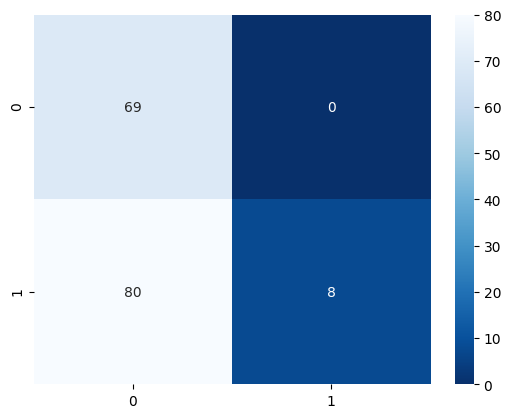

In [108]:
# Построение матрицы ошибок
cm = confusion_matrix(y_test, predictions_clf_2)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues_r');

Таким образом, увеличив показатель Precision до единицы, матрица ошибок обновленной модели показывает:

- 69 случаев модель пресказывает TN, то есть правильно отнесла невкусное молоко к категории "НЕвкусное"
- 0 случаев модель пресказывает FP, то есть отнесла невкусное молоко к категории "вкусное"
- 80 случев модель пресказывает FN, то есть отнесла вкусное молоко в категории "НЕвкусное"
- 8 случев модель пресказывает TP, то есть правильно определяет вкусное молоко к категории "вкусное"

### Примененеие модели логистической регрессии к датафрейму `cow_buy`

#### Подготовка `cow_buy` к прогнозированию

In [114]:
# Список всех категориальных признаков 
cat_col_names = ['sugar_protein_ratio', 'breed', 'pasture', 'breed_dad', 'age', 'name_dad']

# Список всех количественных признаков 
num_col_names = ['yield_kg', 'feed_energy_unit', 'protein_g', 'fat_content_per', 'protein_per']

# преобразование категориальных признаков в тестовой выборке
X_cow_ohe = encoder.transform(cow_buy[cat_col_names])

# список новых столбцов после кодирования
encoder_col_names = encoder.get_feature_names()

# преобразование количественных признаков в тестовой выборке
X_cow_scaled = scaler.transform(cow_buy[num_col_names])

X_cow_ohe = pd.DataFrame(X_cow_ohe, columns=encoder_col_names)
X_cow_scaled = pd.DataFrame(X_cow_scaled, columns=num_col_names)

# объединяем все преобразованные данные в тренировочный и тестовый датафреймы
X_cow = pd.concat([X_cow_ohe, X_cow_scaled], axis=1)

In [116]:
# Прогнозирование
cow_buy['taste'] = (clf_1.predict_proba(X_cow)[:,1] >= 0.798).astype(int) 

In [117]:
cow_buy[cow_buy['taste']==1]

,breed,pasture,breed_dad,name_dad,fat_content_per,protein_per,age,feed_energy_unit,protein_g,sugar_protein_ratio,yield_kg,taste


Получается, что при использовании выбранного порога ни одна корова не даст вкусное молоко.

Необходимо сократить порог до 0.70

#### Прогнозирование

In [121]:
# Прогнозирование
cow_buy['taste'] = (clf_1.predict_proba(X_cow)[:,1] >= 0.70).astype(int) 
cow_buy[cow_buy['taste']==1]

,breed,pasture,breed_dad,name_dad,fat_content_per,protein_per,age,feed_energy_unit,protein_g,sugar_protein_ratio,yield_kg,taste
0,Вис Бик Айдиал,Холмистое,Айдиал,Геркулес,3.58,3.076,более_2_лет,15.276162,2019.947532,более 0.91,6615.624911,1
9,РефлешнСоверинг,Холмистое,Айдиал,Буйный,3.40,3.079,менее_2_лет,15.276162,2019.947532,более 0.91,6408.113982,1


Таким образом, с наибольшей уверенностью фермеру стоит приобрести именно этих дву коров, если он гарантированно желает получить от них вкусное молоко. 

## Итоговые выводы

### Предобработка данных

В данном шаге удалось:

- Перевести названия столбцов в датафреймах к языку Python.
- Изменить тип данных в датафреймах:
  - В датафрейме ferma_main в следующих столбцах:
    - feed_energy_unit: object -> float64
    - sugar_protein_ratio: object -> float64
    - fat_content_per: object -> float64
    - protein_per: object -> float64
    - taste: object -> bool
 
  - В датафрейме cow_buy в следующих столбцах:
    - fat_content_per: object -> float64
    - protein_per: object -> float64
- Убрать 9 явных дубликатов.
- Убрать неявные дубликаты в двух категориальных признаках датафрейма ferma_main.
- Провести проверку на наличие пропущенных значений. Пропуски обнаружены не были. 

### Исследовательский анализ данных 

В данном шаге удалось:

- Построить диаграммы размаха и гистограммы для количественных признаков
- Построить столбчатые и круговые диаграммы для категориальных признаков

Оказалось, что стада двух молохных хозяйств распределены по показателям примерно одинаково. Из особенностей: 
- В стаде Вольного луга быки-отцы делятся примерно на две равные по поголовью породы. Однако, в стаде ЭкоФермы преобладают быки породы Соверин. 
- стадо "ЭкоФермы" моложе, в нем концентрация коров в возрасте менее 2 лет составляет 31%, в то время как в стаде "Вольного луга" таких коров 17,5%. 

### Корреляционный анализ данных

На данном этапе удалось сделать следующие выводы:

- Количественные показатели, которые больше всего оказывают влияние на удой коров:
  - ЭКЕ в корме,
  - количество чистого протеина в корме,
  - СПО корма.
- Качественные показатели, которые больше всего оказывают влияние на удой коров:
  - возраст коровы (нужна старше 2 лет),
  - тип пастбища (нужно холмистое),
  - порода папы-быка (нужен Айдиал).
- Признаки, которые не коррелируют с целевой переменной "удой":
  - жирность молока (%),
  - содержание белков в молоке (%),
  - вкус молока,
  - порода коровы. 

### Модель линейной регрессии

- Было построено 3 модели линейлой регрессии, прогнозирующие показатель годового удоя коров. 
- Показатели метрик у 3-й модели следующие:
  - MSE: 35969.44
  - RMSE: 189.66
  - MAE: 146.71
- В результате использования модели №3 удалось составить прогноз удоя коров из стада ЭкаФермы. 

### Модель логистической регрессии

- Была построена модель логистической регрессии, прогнозирующая вкус молока коров.
- В результате использования модели логистической регрессии удалось определить 2-х коров из стада ЭкаФермы, которые гарантированно будут давать "вкусное" молоко. 